## 3 - Export Data Assessment (Inter-parameter) (cleaned)

##### Imports

In [1]:
import os
import ast
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

import matplotlib.pyplot as plt
import seaborn as sns

import dask.dataframe as dd

##### Data Loading (cleaned)

In [7]:
# Load CLEANED ddfs into dictionary (exception for 'surf_position' as a df)
root_dir = './cleaned_data'
def load_cleaned_data(root_dir, exception=False): # Get csv file reads into one dictionary
    data = {}
    for file in os.listdir(root_dir):
        file_path = os.path.join(root_dir, file)
        file_name = os.path.splitext(file)[0]  # file name without '.csv'
        if file.endswith('.csv') and file != 'surf_position.csv':
            data[file_name] = dd.read_csv(file_path)  # read and attach to dict
        elif exception and file == 'surf_position.csv':
            data[file_name] = pd.read_csv(file_path, converters=converters)  # read as normal and attach to dict
    return data
def parse(filedata):
    for line in filedata.split('\n'): 
        line = line.strip()
        if not line:
            continue  # skip empty lines
        row = ast.literal_eval(line) # evaluate the str into obj
    return row
converters = {
    "img_to_surf_trans": parse,
    "surf_to_img_trans": parse,
}

data = load_cleaned_data(root_dir)
participant_ids = [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]

In [6]:
gui_ddf = data['gui_data']
gui_df = gui_ddf.compute()
gui_df['block_data'] = gui_df['block_data'].apply(lambda x: eval(x))

### 1. Ocular Correlations
(value only)
Gaze, Fixations, Blink, Pupil, Surface gaze

##### Gaze-fixations confidence
- Positive correlation
- Mean: 0.76
- Std : 0.07

In [4]:
gaze_conf_df = data['gaze'][['participant_id', 'gaze_timestamp', 'confidence']].compute()
fix_conf_df = data['fixation'][['participant_id', 'start_timestamp', 'confidence', 'duration', 'dispersion']].compute()
correlation_results = []

for pid in participant_ids:
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]
    participant_fix_df = fix_conf_df[fix_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_gaze_df,
        participant_fix_df,
        left_on=['gaze_timestamp', 'participant_id'],
        right_on=['start_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_gaze', '_fix')
    )
    merged_df.drop(columns=['start_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_gaze'].corr(merged_df['confidence_fix'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.7635823806323706
Std: 0.07179011688172156
    participant_id  correlation
0                1     0.755600
1                2     0.801051
2                4     0.634339
3                5     0.749038
4                6     0.616272
5                7     0.871625
6                8     0.893577
7                9     0.775882
8               10     0.794738
9               11     0.652270
10              12     0.786944
11              13     0.761851
12              14     0.736556
13              15     0.798003
14              16     0.780659
15              17     0.762697
16              18     0.716798
17              19     0.835886
18              20     0.784280


##### Blink-pupil confidence
- (slight) Positive correlation
- Mean: 0.18
- Std : 0.30

In [5]:
blink_conf_df = data['blink'][['participant_id', 'start_timestamp', 'confidence']].compute()
pupil_conf_df = data['pupil'][['participant_id', 'pupil_timestamp', 'confidence', 'diameter_3d']].compute().dropna()
correlation_results = []

for pid in participant_ids:
    participant_blink_df = blink_conf_df[blink_conf_df['participant_id'] == pid]
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_blink_df,
        participant_pupil_df,
        left_on=['start_timestamp', 'participant_id'],
        right_on=['pupil_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_blink', '_pupil')
    )
    merged_df.drop(columns=['pupil_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_blink'].corr(merged_df['confidence_pupil'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.18269664210613137
Std: 0.09306027228268247
    participant_id  correlation
0                1     0.236592
1                2     0.058089
2                4     0.182888
3                5     0.088719
4                6     0.214444
5                7     0.215302
6                8     0.238855
7                9     0.132268
8               10     0.179579
9               11    -0.021598
10              12     0.188032
11              13     0.299772
12              14     0.236376
13              15     0.273505
14              16     0.354723
15              17     0.050917
16              18     0.250547
17              19     0.144658
18              20     0.147567


##### Pupil-gaze confidence
- Same value
- Mean: 0.99
- Std : 0.002

In [6]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_pupil_df,
        participant_gaze_df,
        left_on=['pupil_timestamp', 'participant_id'],
        right_on=['gaze_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_pupil', '_gaze')
    )
    merged_df.drop(columns=['gaze_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_pupil'].corr(merged_df['confidence_gaze'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation, "n_pupils": participant_pupil_df.shape[0], "n_merged": merged_df.shape[0]})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.9954351772937776
Std: 0.002834079264991514
    participant_id  correlation  n_pupils  n_merged
0                1     0.997977    999763     25926
1                2     0.990783    754849     42244
2                4     0.997799    759583     45901
3                5     0.997299    910378     43574
4                6     0.996971    805269     32858
5                7     0.989327    787003     48296
6                8     0.996628    784676    136324
7                9     0.996003    802430     27214
8               10     0.996493    813565     34717
9               11     0.997813    800992     24715
10              12     0.992332    792195     24483
11              13     0.994943    906996     30778
12              14     0.997569    856108     24580
13              15     0.990849    798977     46584
14              16     0.997711    919657     38930
15              17     0.992053    801133     21259
16              18     0.996512    887831     32029
17           

In [7]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_pupil_df,
        participant_gaze_df,
        left_on=['pupil_timestamp', 'participant_id'],
        right_on=['gaze_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_pupil', '_gaze')
    )
    merged_df.drop(columns=['gaze_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_pupil'].corr(merged_df['confidence_gaze'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation, "n_pupils": participant_pupil_df.shape[0], "n_merged": merged_df.shape[0]})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.9954351772937776
Std: 0.002834079264991514
    participant_id  correlation  n_pupils  n_merged
0                1     0.997977    999763     25926
1                2     0.990783    754849     42244
2                4     0.997799    759583     45901
3                5     0.997299    910378     43574
4                6     0.996971    805269     32858
5                7     0.989327    787003     48296
6                8     0.996628    784676    136324
7                9     0.996003    802430     27214
8               10     0.996493    813565     34717
9               11     0.997813    800992     24715
10              12     0.992332    792195     24483
11              13     0.994943    906996     30778
12              14     0.997569    856108     24580
13              15     0.990849    798977     46584
14              16     0.997711    919657     38930
15              17     0.992053    801133     21259
16              18     0.996512    887831     32029
17           

##### Gaze-surface gaze confidence
- Same value
- Mean: 1.00
- Std : 0.00

In [8]:
surf_gaze_conf_df = data['surf_gaze'][['participant_id', 'gaze_timestamp', 'world_timestamp', 'confidence']].compute()
correlation_results = []

for pid in participant_ids:
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]
    participant_surf_gaze_df = surf_gaze_conf_df[surf_gaze_conf_df['participant_id'] == pid]
    # display(f'PARTICIPANT {pid}')
    # display(f'n_gaze: {participant_gaze_df.shape[0]}')
    # display(f'n_surf_gaze: {participant_surf_gaze_df.shape[0]}')

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_gaze_df,
        participant_surf_gaze_df,
        on=['gaze_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_gaze', '_surf_gaze')
    )
    merged_df.drop(columns=['gaze_timestamp'], inplace=True)
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_gaze'].corr(merged_df['confidence_surf_gaze'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.9990327308324475
Std: 0.0006899098311195898
    participant_id  correlation
0                1     0.999543
1                2     0.998856
2                4     0.999529
3                5     0.999189
4                6     0.999045
5                7     0.996651
6                8     0.999254
7                9     0.999335
8               10     0.999131
9               11     0.999333
10              12     0.998674
11              13     0.998326
12              14     0.999438
13              15     0.998468
14              16     0.999664
15              17     0.999143
16              18     0.998922
17              19     0.999531
18              20     0.999591


##### Surface gaze-fixations confidence
- Almost same value
- Mean: 0.74
- Std : 0.092

In [10]:
# Load data
surf_gaze_conf_df = data['surf_gaze'].iloc[:, 1:].compute()
fix_conf_df = data['fixation'][['participant_id', 'start_timestamp', 'confidence', 'duration', 'dispersion']].compute()

In [11]:
correlation_results = []

for pid in participant_ids:
    participant_surf_gaze_df = surf_gaze_conf_df[surf_gaze_conf_df['participant_id'] == pid]
    participant_fix_df = fix_conf_df[fix_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_surf_gaze_df,
        participant_fix_df,
        left_on=['gaze_timestamp', 'participant_id'],
        right_on=['start_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_gaze', '_fix')
    )
    merged_df.drop(columns=['start_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_gaze'].corr(merged_df['confidence_fix'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.7406321418556135
Std: 0.09244687148801006
    participant_id  correlation
0                1     0.737431
1                2     0.801076
2                4     0.630522
3                5     0.705682
4                6     0.592508
5                7     0.868623
6                8     0.898476
7                9     0.531321
8               10     0.764497
9               11     0.643277
10              12     0.773384
11              13     0.743767
12              14     0.732724
13              15     0.800236
14              16     0.820586
15              17     0.759595
16              18     0.688980
17              19     0.809719
18              20     0.769607


##### Surface gaze-surface markers confidence
- No correlation -> independent
- Mean: 0.01
- Std : 0.03

In [12]:
surf_pos_conf_df = data['surf_position'][['participant_id', 'world_timestamp', 'num_detected_markers']]
correlation_results = []

for pid in participant_ids:
    participant_surf_gaze_df = surf_gaze_conf_df[surf_gaze_conf_df['participant_id'] == pid]
    participant_surf_pos_df = surf_pos_conf_df[surf_pos_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_surf_gaze_df,
        participant_surf_pos_df,
        left_on=['world_timestamp', 'participant_id'],
        right_on=['world_timestamp', 'participant_id'],
        how='inner',
    )
    merged_df.drop(columns=['world_timestamp'], inplace=True)

    correlation = merged_df['confidence'].corr(merged_df['num_detected_markers'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.015709453444358933
Std: 0.027667914321664797
    participant_id  correlation
0                1     0.022860
1                2    -0.029780
2                4     0.000469
3                5    -0.005695
4                6     0.020135
5                7     0.016218
6                8     0.050415
7                9     0.030983
8               10     0.013630
9               11     0.016608
10              12     0.014322
11              13     0.073753
12              14    -0.041317
13              15     0.027147
14              16    -0.011993
15              17    -0.007002
16              18     0.048500
17              19     0.031443
18              20     0.027786


##### Pupil diameter-surface fixation duration
- No correlation
- Mean: 0.0
- Std : 0.03
- Check next 200 ms(?)
- Check event-related(?)

In [13]:
pupil_conf_df = data['pupil'][['participant_id', 'pupil_timestamp', 'confidence', 'diameter_3d']].compute().dropna()

In [15]:
# Load surf_fix handling repeated rows
surf_fix_conf_df = data['surf_fixation'].compute()
surf_fix_conf_df = surf_fix_conf_df.groupby(['participant_id', 'fixation_id']).agg({
    'start_timestamp': 'first',
    'duration': 'first',
    'dispersion': 'first',
    'norm_pos_x': 'first',
    'norm_pos_y': 'first',
    'on_surf': 'first',
}).reset_index()

# Rename the aggregated world_index column to world_indexes
surf_fix_conf_df = surf_fix_conf_df.rename(columns={'world_index': 'world_indexes'})
surf_fix_conf_ddf = dd.from_pandas(surf_fix_conf_df, npartitions=2)

In [16]:
def get_diameter3d(pp_df, sfix_df):
    mean_diameters = []
    std_diameters = []
    for idx, fixation in sfix_df.iterrows():
        start_time = fixation['start_timestamp'] -.003
        end_time = start_time + (fixation['duration']/1000) + .003   # from [ms] to [s]

        # Filter pupil data within the fixation period
        relevant_pupil_data = pp_df[(pp_df['pupil_timestamp'] >= start_time) & (pp_df['pupil_timestamp'] <= end_time)]

        mean_diameter = relevant_pupil_data['diameter_3d'].mean()
        std_diameter = relevant_pupil_data['diameter_3d'].std()
        mean_diameters.append(mean_diameter)
        std_diameters.append(std_diameter)
    return [mean_diameters, std_diameters]

In [17]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_surf_fix_df = surf_fix_conf_df[surf_fix_conf_df['participant_id'] == pid].copy() # copy to handle unexpected behaviors

    # Extract diameter3d details
    diameter3d_details = get_diameter3d(participant_pupil_df, participant_surf_fix_df)
    participant_surf_fix_df.loc[:, 'mean_diameter_3d'] = diameter3d_details[0]
    participant_surf_fix_df.loc[:, 'std_diameter_3d'] = diameter3d_details[1]

    # Drop NaN values before calculating correlation
    participant_surf_fix_df = participant_surf_fix_df.dropna(subset=['mean_diameter_3d', 'duration'])

    correlation_mean = participant_surf_fix_df['mean_diameter_3d'].corr(participant_surf_fix_df['duration'])
    correlation_std = participant_surf_fix_df['std_diameter_3d'].corr(participant_surf_fix_df['duration'])
    correlation_results.append({'participant_id': pid, 'correlation_mean': correlation_mean, 'correlation_std': correlation_std})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation_mean'].mean()}")
print(f"Std: {correlation_df['correlation_std'].std()}")
print(correlation_df)

Mean: 0.004620682892965797
Std: 0.03600748485844978
    participant_id  correlation_mean  correlation_std
0                1          0.020280        -0.035101
1                2         -0.008250        -0.013960
2                4         -0.015691        -0.102851
3                5         -0.086408         0.013160
4                6         -0.043754        -0.037822
5                7          0.031613        -0.026936
6                8          0.064661        -0.037463
7                9          0.021620         0.039180
8               10         -0.044640        -0.018865
9               11          0.028660        -0.001710
10              12          0.033204         0.008789
11              13         -0.005857         0.000574
12              14         -0.004579         0.017918
13              15          0.134251         0.041579
14              16         -0.000379        -0.043576
15              17         -0.021812        -0.032660
16              18         -0.

##### Pupil diameter-surface fixation dispersion
- No correlation
- Mean: -0.05
- Std : 0.04
- Check next 200 ms(?)
- Check event-related(?)

In [18]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_surf_fix_df = surf_fix_conf_df[surf_fix_conf_df['participant_id'] == pid].copy() # copy to handle unexpected behaviors

    # Extract diameter3d details
    diameter3d_details = get_diameter3d(participant_pupil_df, participant_surf_fix_df)
    participant_surf_fix_df.loc[:, 'mean_diameter_3d'] = diameter3d_details[0]
    participant_surf_fix_df.loc[:, 'std_diameter_3d'] = diameter3d_details[1]

    # Drop NaN values before calculating correlation
    participant_surf_fix_df = participant_surf_fix_df.dropna(subset=['mean_diameter_3d', 'duration'])

    correlation_mean = participant_surf_fix_df['mean_diameter_3d'].corr(participant_surf_fix_df['dispersion'])
    correlation_std = participant_surf_fix_df['std_diameter_3d'].corr(participant_surf_fix_df['dispersion'])
    correlation_results.append({'participant_id': pid, 'correlation_mean': correlation_mean, 'correlation_std': correlation_std})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation_mean'].mean()}")
print(f"Std: {correlation_df['correlation_std'].std()}")
print(correlation_df)

Mean: -0.0520403911064473
Std: 0.036603437114071075
    participant_id  correlation_mean  correlation_std
0                1         -0.081715         0.037622
1                2         -0.017865        -0.007880
2                4         -0.013314         0.051640
3                5          0.021193        -0.015180
4                6          0.009554         0.035987
5                7         -0.127834        -0.051210
6                8         -0.024205         0.025375
7                9         -0.121045        -0.063321
8               10          0.002975         0.011836
9               11         -0.037926         0.004232
10              12         -0.064948        -0.008769
11              13         -0.049715        -0.027437
12              14         -0.059135        -0.002790
13              15         -0.240331        -0.069392
14              16         -0.022652         0.039496
15              17         -0.016771         0.000385
16              18         -0.

### 2. Gui-Ocular Correlations
(value only) Difficulty, Frequency, Reaction time, Completion time, Errors, Diameter, Dispersion, Duration

In [45]:
# Define variables
# Difficulty
easy_block = [1, 2, 5, 6]
hard_block = [3, 4, 7, 8]

# Frequency
slow_block = [1, 3, 5, 7]
fast_block = [2, 4, 6, 8]

# Difficulty+Frequency
easy_slow_block = [1, 5]
easy_fast_block = [2, 6]
hard_slow_block = [3, 7]
hard_fast_block = [4, 8]

In [46]:
# Create gui dfs
gui_df_easy = gui_df[gui_df['block_type'].isin(easy_block)]
gui_df_hard = gui_df[gui_df['block_type'].isin(hard_block)]

gui_df_slow = gui_df[gui_df['block_type'].isin(slow_block)]
gui_df_fast = gui_df[gui_df['block_type'].isin(fast_block)]

gui_df_easy_slow = gui_df[gui_df['block_type'].isin(easy_slow_block)]
gui_df_hard_slow = gui_df[gui_df['block_type'].isin(hard_slow_block)]
gui_df_easy_fast = gui_df[gui_df['block_type'].isin(easy_fast_block)]
gui_df_hard_fast = gui_df[gui_df['block_type'].isin(hard_fast_block)]

##### Difficulty - Pupil diameter
- No correlation

In [30]:
# Diameter data based on difficulty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
interval_mask_easy = pd.Series(False, index=diameter_df.index)
interval_mask_hard = pd.Series(False, index=diameter_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

diameter_df_easy = diameter_df.loc[interval_mask_easy, 'diameter_3d']
diameter_df_hard = diameter_df.loc[interval_mask_hard, 'diameter_3d']

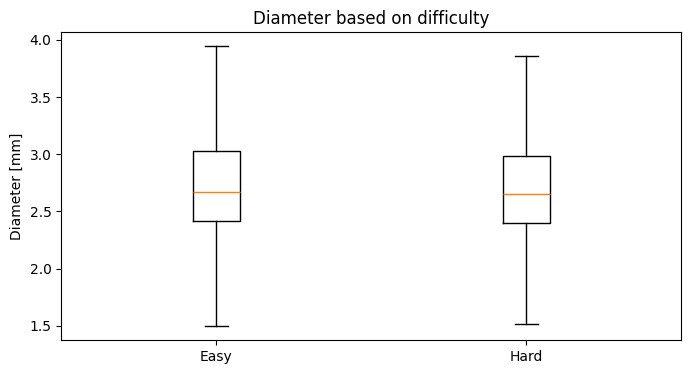

Easy: 2.74 mm (~0.51)
Hard: 2.71 mm (~0.48)


In [31]:
# Visualize
mean_easy = round(np.mean(diameter_df_easy), 2)
mean_hard = round(np.mean(diameter_df_hard), 2)
std_easy = round(np.std(diameter_df_easy), 2)
std_hard = round(np.std(diameter_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([diameter_df_easy, diameter_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Easy: {np.mean(mean_easy)} mm (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} mm (~{std_hard})")

In [32]:
# Diameter data based on difficulty (tasks data only)
unix_task_intervals_easy = list(gui_df_easy[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_hard = list(gui_df_hard[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
task_interval_mask_easy = pd.Series(False, index=diameter_df.index)
task_interval_mask_hard = pd.Series(False, index=diameter_df.index)

for start, end in unix_task_intervals_easy:
    task_interval_mask_easy |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard:
    task_interval_mask_hard |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

task_diameter_df_easy = diameter_df.loc[task_interval_mask_easy, 'diameter_3d']
task_diameter_df_hard = diameter_df.loc[task_interval_mask_hard, 'diameter_3d']

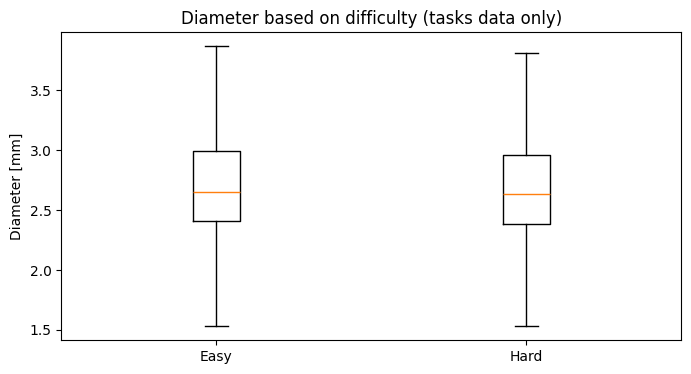

[tasks data only]
Easy: 2.73 mm (~0.51)
Hard: 2.7 mm (~0.47)


In [33]:
# Visualize (tasks data only)
mean_easy = round(np.mean(task_diameter_df_easy), 2)
mean_hard = round(np.mean(task_diameter_df_hard), 2)
std_easy = round(np.std(task_diameter_df_easy), 2)
std_hard = round(np.std(task_diameter_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([task_diameter_df_easy, task_diameter_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty (tasks data only)')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Diameter [mm]')
plt.show()

print("[tasks data only]")
print(f"Easy: {np.mean(mean_easy)} mm (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} mm (~{std_hard})")

##### Frequency - Pupil diameter
- No correlation

In [34]:
# Diameter data based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
interval_mask_slow = pd.Series(False, index=diameter_df.index)
interval_mask_fast = pd.Series(False, index=diameter_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

diameter_df_slow = diameter_df.loc[interval_mask_slow, 'diameter_3d']
diameter_df_fast = diameter_df.loc[interval_mask_fast, 'diameter_3d']

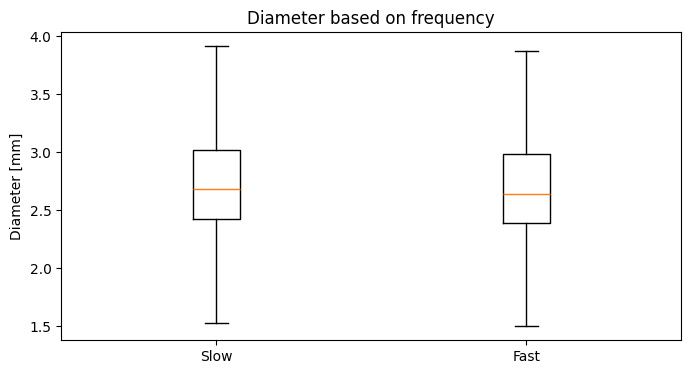

Slow: 2.74 mm (~0.48)
Fast: 2.72 mm (~0.51)


In [35]:
# Visualize
mean_slow = round(np.mean(diameter_df_slow), 2)
mean_fast = round(np.mean(diameter_df_fast), 2)
std_slow = round(np.std(diameter_df_slow), 2)
std_fast = round(np.std(diameter_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([diameter_df_slow, diameter_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on frequency')
plt.xticks([1, 2], ['Slow', 'Fast'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Slow: {np.mean(mean_slow)} mm (~{std_slow})")
print(f"Fast: {np.mean(mean_fast)} mm (~{std_fast})")

In [36]:
# Diameter data based on frequency (tasks data only)
unix_task_intervals_slow = list(gui_df_slow[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_fast = list(gui_df_fast[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
task_interval_mask_slow = pd.Series(False, index=diameter_df.index)
task_interval_mask_fast = pd.Series(False, index=diameter_df.index)

for start, end in unix_task_intervals_slow:
    task_interval_mask_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_fast:
    task_interval_mask_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

task_diameter_df_slow = diameter_df.loc[task_interval_mask_slow, 'diameter_3d']
task_diameter_df_fast = diameter_df.loc[task_interval_mask_fast, 'diameter_3d']

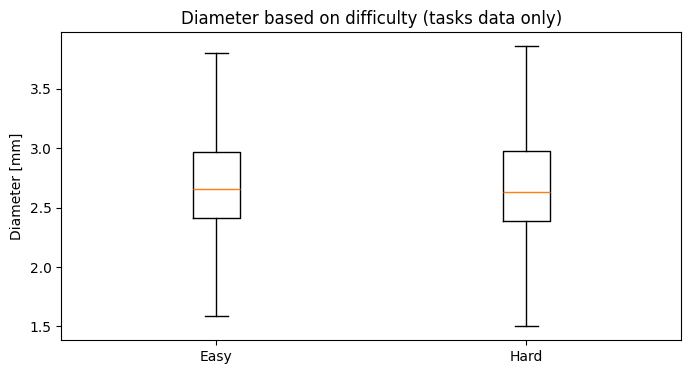

[tasks data only]
Easy: 2.72 mm (~0.46)
Hard: 2.71 mm (~0.51)


In [37]:
# Visualize (tasks data only)
mean_easy = round(np.mean(task_diameter_df_slow), 2)
mean_hard = round(np.mean(task_diameter_df_fast), 2)
std_easy = round(np.std(task_diameter_df_slow), 2)
std_hard = round(np.std(task_diameter_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([task_diameter_df_slow, task_diameter_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty (tasks data only)')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Diameter [mm]')
plt.show()

print("[tasks data only]")
print(f"Easy: {np.mean(mean_easy)} mm (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} mm (~{std_hard})")

##### Difficulty&Frequency - Pupil diameter
- No correlation

In [38]:
# Diameter data based on difficulty+frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
interval_mask_easy_slow = pd.Series(False, index=diameter_df.index)
interval_mask_hard_slow = pd.Series(False, index=diameter_df.index)
interval_mask_easy_fast = pd.Series(False, index=diameter_df.index)
interval_mask_hard_fast = pd.Series(False, index=diameter_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

diameter_df_easy_slow = diameter_df.loc[interval_mask_easy_slow, 'diameter_3d']
diameter_df_hard_slow = diameter_df.loc[interval_mask_hard_slow, 'diameter_3d']
diameter_df_easy_fast = diameter_df.loc[interval_mask_easy_fast, 'diameter_3d']
diameter_df_hard_fast = diameter_df.loc[interval_mask_hard_fast, 'diameter_3d']

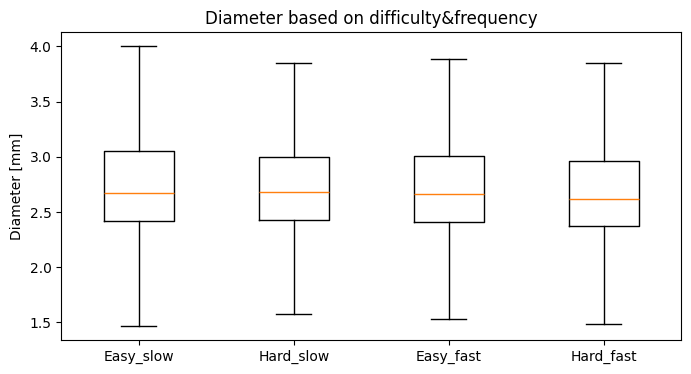

Easy_slow: 2.75 mm (~0.49)
Hard_slow: 2.73 mm (~0.47)
Easy_fast: 2.74 mm (~0.53)
Hard_fast: 2.69 mm (~0.49)


In [39]:
# Visualize
mean_easy_slow = round(np.mean(diameter_df_easy_slow), 2)
mean_hard_slow = round(np.mean(diameter_df_hard_slow), 2)
mean_easy_fast = round(np.mean(diameter_df_easy_fast), 2)
mean_hard_fast = round(np.mean(diameter_df_hard_fast), 2)
std_easy_slow = round(np.std(diameter_df_easy_slow), 2)
std_hard_slow = round(np.std(diameter_df_hard_slow), 2)
std_easy_fast = round(np.std(diameter_df_easy_fast), 2)
std_hard_fast = round(np.std(diameter_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([diameter_df_easy_slow, diameter_df_hard_slow, diameter_df_easy_fast, diameter_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} mm (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} mm (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} mm (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} mm (~{std_hard_fast})")

In [40]:
# Diameter data based on difficulty+frequency
unix_task_intervals_easy_slow = list(gui_df_easy_slow[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_hard_slow = list(gui_df_hard_slow[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_easy_fast = list(gui_df_easy_fast[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_hard_fast = list(gui_df_hard_fast[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
task_interval_mask_easy_slow = pd.Series(False, index=diameter_df.index)
task_interval_mask_hard_slow = pd.Series(False, index=diameter_df.index)
task_interval_mask_easy_fast = pd.Series(False, index=diameter_df.index)
task_interval_mask_hard_fast = pd.Series(False, index=diameter_df.index)

for start, end in unix_task_intervals_easy_slow:
    task_interval_mask_easy_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_slow:
    task_interval_mask_hard_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_easy_fast:
    task_interval_mask_easy_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_fast:
    task_interval_mask_hard_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

task_diameter_df_easy_slow = diameter_df.loc[task_interval_mask_easy_slow, 'diameter_3d']
task_diameter_df_hard_slow = diameter_df.loc[task_interval_mask_hard_slow, 'diameter_3d']
task_diameter_df_easy_fast = diameter_df.loc[task_interval_mask_easy_fast, 'diameter_3d']
task_diameter_df_hard_fast = diameter_df.loc[task_interval_mask_hard_fast, 'diameter_3d']

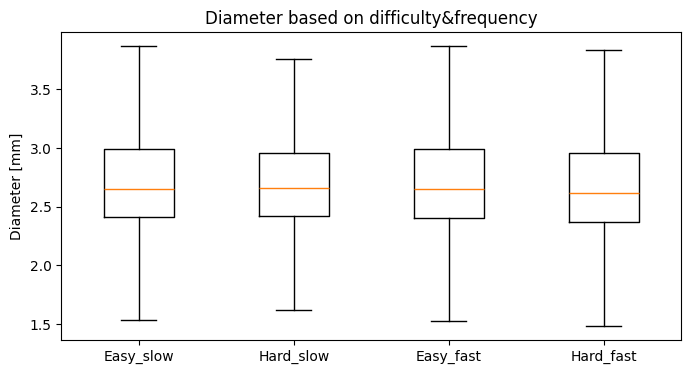

Easy_slow: 2.73 mm (~0.47)
Hard_slow: 2.71 mm (~0.45)
Easy_fast: 2.73 mm (~0.52)
Hard_fast: 2.69 mm (~0.49)


In [41]:
# Visualize
mean_easy_slow = round(np.mean(task_diameter_df_easy_slow), 2)
mean_hard_slow = round(np.mean(task_diameter_df_hard_slow), 2)
mean_easy_fast = round(np.mean(task_diameter_df_easy_fast), 2)
mean_hard_fast = round(np.mean(task_diameter_df_hard_fast), 2)
std_easy_slow = round(np.std(task_diameter_df_easy_slow), 2)
std_hard_slow = round(np.std(task_diameter_df_hard_slow), 2)
std_easy_fast = round(np.std(task_diameter_df_easy_fast), 2)
std_hard_fast = round(np.std(task_diameter_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([task_diameter_df_easy_slow, task_diameter_df_hard_slow, task_diameter_df_easy_fast, task_diameter_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} mm (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} mm (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} mm (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} mm (~{std_hard_fast})")

##### Reaction time - Pupil diameter
- Mixed results

In [42]:
# Diameter data based on reaction time
rt_gui_df = gui_df[['participant_id', 'start_timestamp', 'reaction_time', 'clicked_timestamp']].dropna()
diameter_ddf = data['pupil'].loc[:, ['participant_id', 'pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()
correlation_results = []
pupil_reaction_offset = 1 # second

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_diameter_df = diameter_df.query(f"participant_id == {pid}")
    mean_diameters = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['start_timestamp'] + pupil_reaction_offset
        end = row['clicked_timestamp'] + pupil_reaction_offset
        diameter_in_interval = p_diameter_df[(p_diameter_df['pupil_timestamp_unix'] >= start) & 
                                             (p_diameter_df['pupil_timestamp_unix'] <= end)]
        
        mean_diameter = diameter_in_interval['diameter_3d'].mean()
        mean_diameters.append(mean_diameter)
    
    p_rt_gui_df['mean_diameter'] = mean_diameters
    correlation = p_rt_gui_df['reaction_time'].corr(p_rt_gui_df['mean_diameter'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: 0.06496931559414061
Std Correlation: 0.178686398134126
    participant_id  correlation
0                1     0.353943
1                2     0.312150
2                4     0.093673
3                5     0.385478
4                6     0.020417
5                7    -0.202837
6                8    -0.205271
7                9     0.179497
8               10     0.252769
9               11    -0.039594
10              12    -0.005076
11              13    -0.086899
12              14     0.081978
13              15    -0.098434
14              16     0.031347
15              17    -0.009579
16              18     0.119366
17              19    -0.136778
18              20     0.188268


##### Completion time - Pupil diameter
- Mixed results

In [43]:
# Diameter data based on completion time
rt_gui_df = gui_df[['participant_id', 'clicked_timestamp', 'completion_time', 'end_timestamp']].dropna()
diameter_ddf = data['pupil'].loc[:, ['participant_id', 'pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_diameter_df = diameter_df.query(f"participant_id == {pid}")
    mean_diameters = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['clicked_timestamp']
        end = row['end_timestamp']
        diameter_in_interval = p_diameter_df[(p_diameter_df['pupil_timestamp_unix'] >= start) & 
                                             (p_diameter_df['pupil_timestamp_unix'] <= end)]
        
        mean_diameter = diameter_in_interval['diameter_3d'].mean()
        mean_diameters.append(mean_diameter)
    
    p_rt_gui_df['mean_diameter'] = mean_diameters
    correlation = p_rt_gui_df['completion_time'].corr(p_rt_gui_df['mean_diameter'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: -0.05356139532518908
Std Correlation: 0.1988031697006822
    participant_id  correlation
0                1    -0.023728
1                2    -0.243720
2                4     0.094182
3                5    -0.068757
4                6     0.103030
5                7    -0.196072
6                8    -0.185397
7                9    -0.286865
8               10     0.097591
9               11    -0.039067
10              12    -0.220840
11              13     0.060000
12              14     0.465042
13              15    -0.126665
14              16     0.181388
15              17     0.014888
16              18    -0.236834
17              19    -0.375166
18              20    -0.030677


##### Difficulty - Fixation duration
- Slightly longer in easy condition

In [44]:
# Duration data based on difficulty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

duration_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()

# Get duration intervals
interval_mask_easy = pd.Series(False, index=duration_df.index)
interval_mask_hard = pd.Series(False, index=duration_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

duration_df_easy = duration_df.loc[interval_mask_easy, 'duration']
duration_df_hard = duration_df.loc[interval_mask_hard, 'duration']

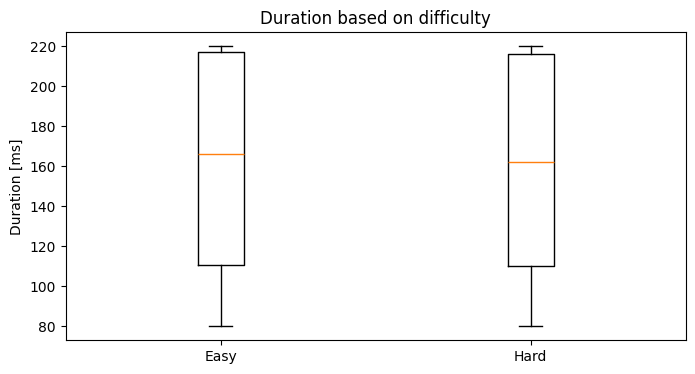

Easy: 161.41 ms (~51.81)
Hard: 159.99 ms (~51.56)


In [45]:
# Visualize
mean_easy = round(np.mean(duration_df_easy), 2)
mean_hard = round(np.mean(duration_df_hard), 2)
std_easy = round(np.std(duration_df_easy), 2)
std_hard = round(np.std(duration_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([duration_df_easy, duration_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Duration based on difficulty')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Easy: {np.mean(mean_easy)} ms (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} ms (~{std_hard})")

##### Frequency - Fixation duration
- Slightly longer in slow condition

In [46]:
# Duration data based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

duration_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()

# Get duration intervals
interval_mask_slow = pd.Series(False, index=duration_df.index)
interval_mask_fast = pd.Series(False, index=duration_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

duration_df_slow = duration_df.loc[interval_mask_slow, 'duration']
duration_df_fast = duration_df.loc[interval_mask_fast, 'duration']

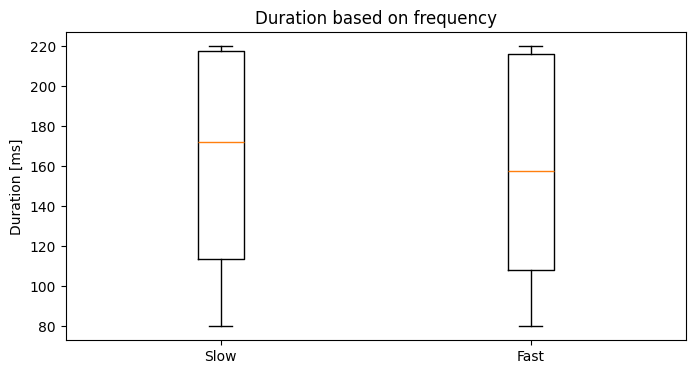

Slow: 164.12 ms (~51.8)
Fast: 157.42 ms (~51.37)


In [47]:
# Visualize
mean_slow = round(np.mean(duration_df_slow), 2)
mean_fast = round(np.mean(duration_df_fast), 2)
std_slow = round(np.std(duration_df_slow), 2)
std_fast = round(np.std(duration_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([duration_df_slow, duration_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on frequency')
plt.xticks([1, 2], ['Slow', 'Fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Slow: {np.mean(mean_slow)} ms (~{std_slow})")
print(f"Fast: {np.mean(mean_fast)} ms (~{std_fast})")

##### Difficulty&Frequency - Fixation duration
- Slightly longer in slow conditions

In [48]:
# Diameter data based on difficulty+frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

duration_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()

# Get diameter intervals
interval_mask_easy_slow = pd.Series(False, index=duration_df.index)
interval_mask_hard_slow = pd.Series(False, index=duration_df.index)
interval_mask_easy_fast = pd.Series(False, index=duration_df.index)
interval_mask_hard_fast = pd.Series(False, index=duration_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

duration_df_easy_slow = duration_df.loc[interval_mask_easy_slow, 'duration']
duration_df_hard_slow = duration_df.loc[interval_mask_hard_slow, 'duration']
duration_df_easy_fast = duration_df.loc[interval_mask_easy_fast, 'duration']
duration_df_hard_fast = duration_df.loc[interval_mask_hard_fast, 'duration']

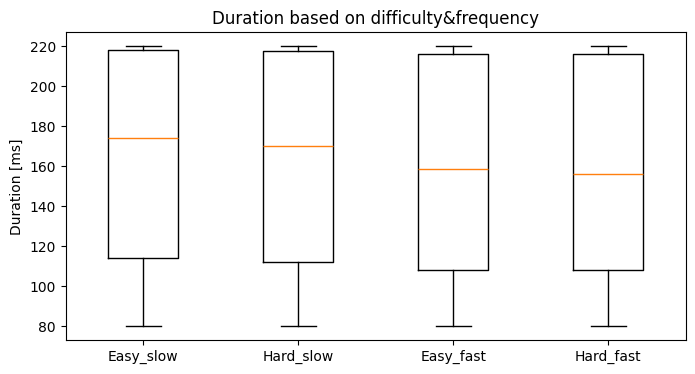

Easy_slow: 164.94 ms (~51.87)
Hard_slow: 163.35 ms (~51.72)
Easy_fast: 158.09 ms (~51.54)
Hard_fast: 156.78 ms (~51.2)


In [49]:
# Visualize
mean_easy_slow = round(np.mean(duration_df_easy_slow), 2)
mean_hard_slow = round(np.mean(duration_df_hard_slow), 2)
mean_easy_fast = round(np.mean(duration_df_easy_fast), 2)
mean_hard_fast = round(np.mean(duration_df_hard_fast), 2)
std_easy_slow = round(np.std(duration_df_easy_slow), 2)
std_hard_slow = round(np.std(duration_df_hard_slow), 2)
std_easy_fast = round(np.std(duration_df_easy_fast), 2)
std_hard_fast = round(np.std(duration_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([duration_df_easy_slow, duration_df_hard_slow, duration_df_easy_fast, duration_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} ms (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} ms (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} ms (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} ms (~{std_hard_fast})")

##### Difficulty&Frequency - Fixation duration (per participant)
- Slightly longer in slow conditions

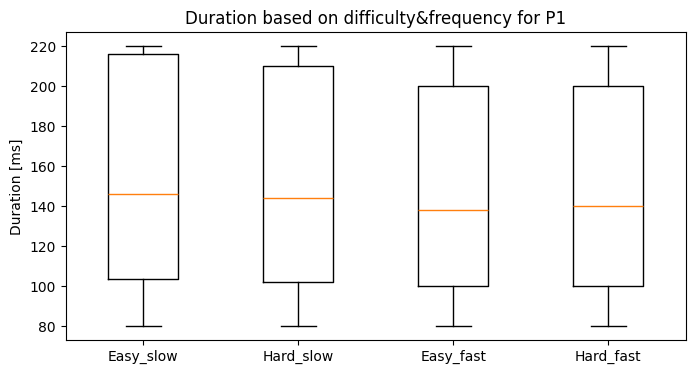

Easy_slow: 152.22 ms (~51.23)
Hard_slow: 150.71 ms (~50.75)
Easy_fast: 146.24 ms (~50.24)
Hard_fast: 147.33 ms (~49.82)


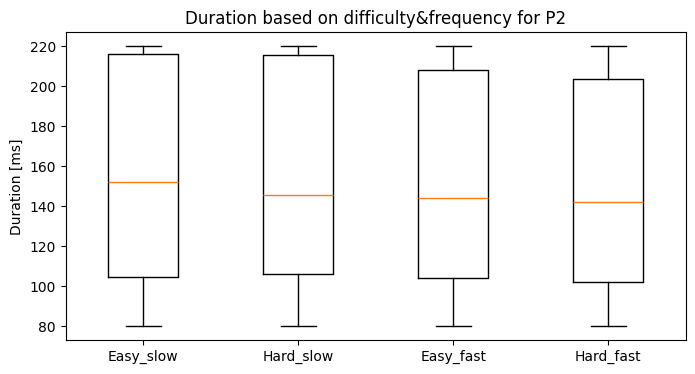

Easy_slow: 154.87 ms (~51.53)
Hard_slow: 152.28 ms (~50.31)
Easy_fast: 151.23 ms (~50.31)
Hard_fast: 149.06 ms (~49.96)


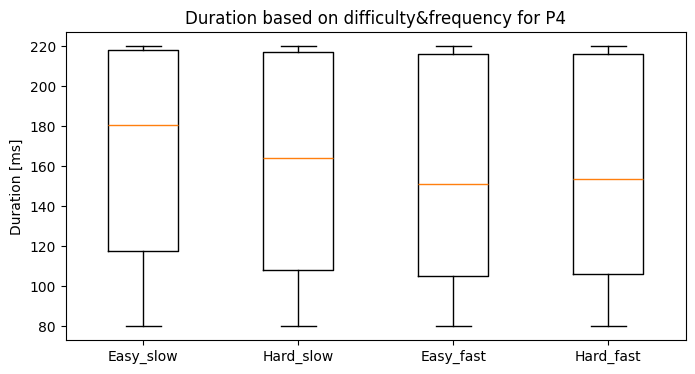

Easy_slow: 167.07 ms (~51.35)
Hard_slow: 160.7 ms (~52.06)
Easy_fast: 154.27 ms (~50.83)
Hard_fast: 155.12 ms (~50.62)


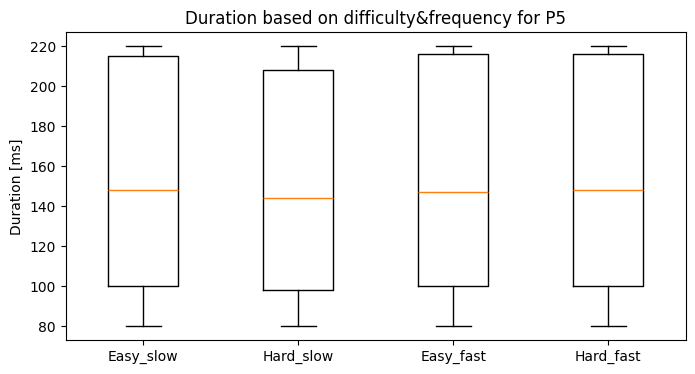

Easy_slow: 151.16 ms (~51.8)
Hard_slow: 148.92 ms (~51.8)
Easy_fast: 151.47 ms (~52.36)
Hard_fast: 151.85 ms (~51.73)


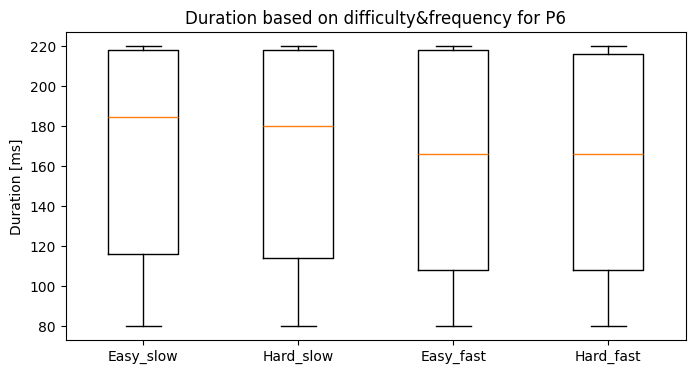

Easy_slow: 168.13 ms (~52.65)
Hard_slow: 166.46 ms (~52.77)
Easy_fast: 160.78 ms (~53.23)
Hard_fast: 160.72 ms (~52.65)


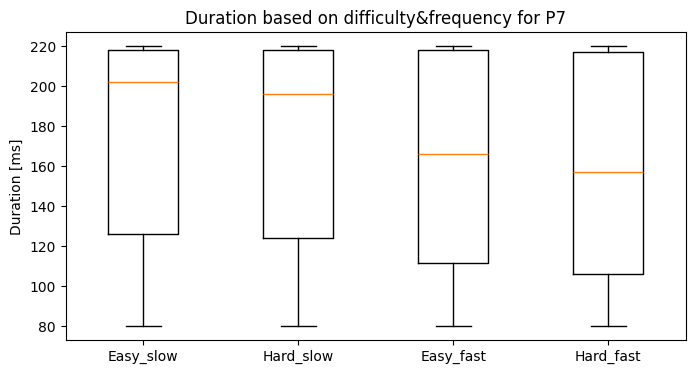

Easy_slow: 173.91 ms (~50.54)
Hard_slow: 172.14 ms (~50.85)
Easy_fast: 161.16 ms (~51.41)
Hard_fast: 156.88 ms (~51.74)


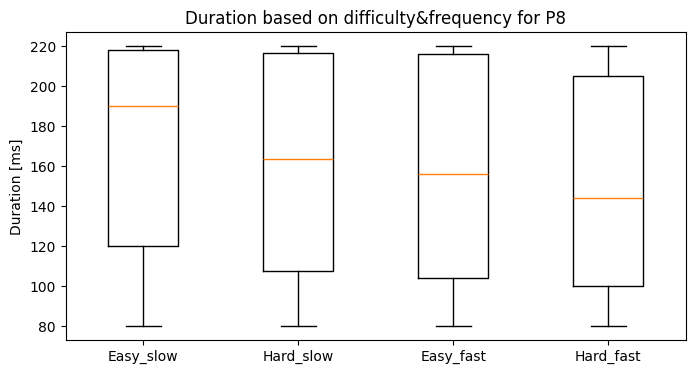

Easy_slow: 170.04 ms (~51.68)
Hard_slow: 160.02 ms (~52.53)
Easy_fast: 155.91 ms (~51.33)
Hard_fast: 149.88 ms (~51.0)


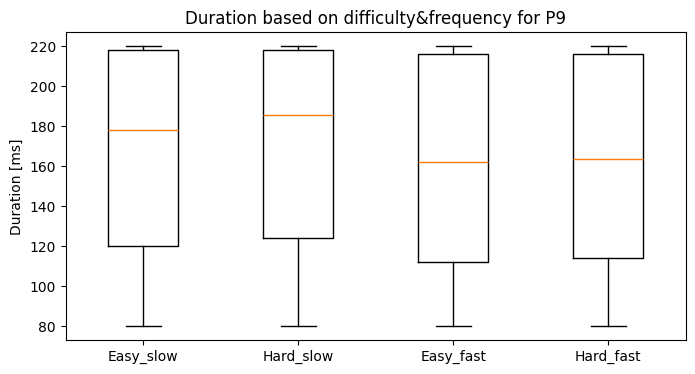

Easy_slow: 167.47 ms (~51.21)
Hard_slow: 170.2 ms (~49.94)
Easy_fast: 159.45 ms (~50.45)
Hard_fast: 160.64 ms (~50.23)


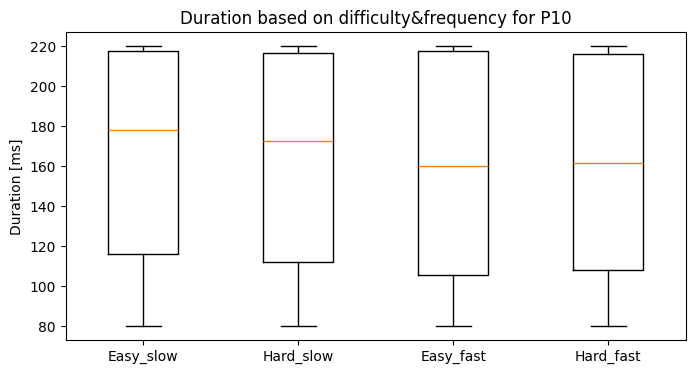

Easy_slow: 166.45 ms (~51.84)
Hard_slow: 163.76 ms (~52.16)
Easy_fast: 157.74 ms (~52.37)
Hard_fast: 158.41 ms (~52.04)


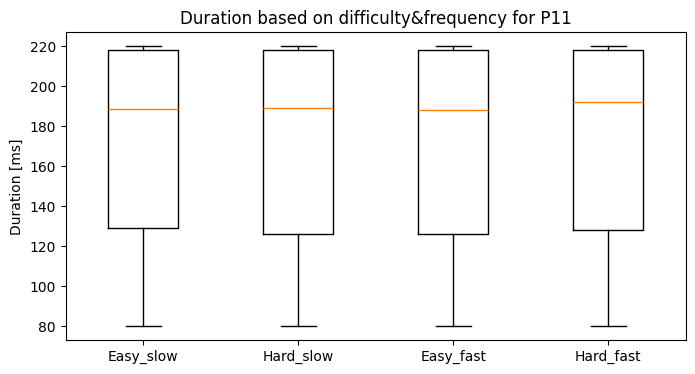

Easy_slow: 171.94 ms (~49.17)
Hard_slow: 171.36 ms (~49.39)
Easy_fast: 170.93 ms (~49.72)
Hard_fast: 172.88 ms (~48.74)


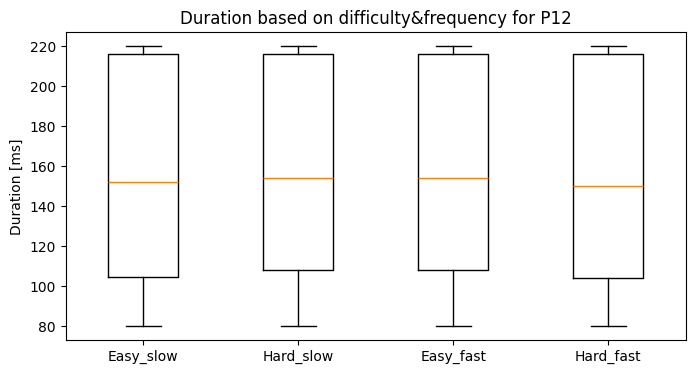

Easy_slow: 155.2 ms (~51.45)
Hard_slow: 155.98 ms (~50.54)
Easy_fast: 156.22 ms (~50.71)
Hard_fast: 152.93 ms (~50.59)


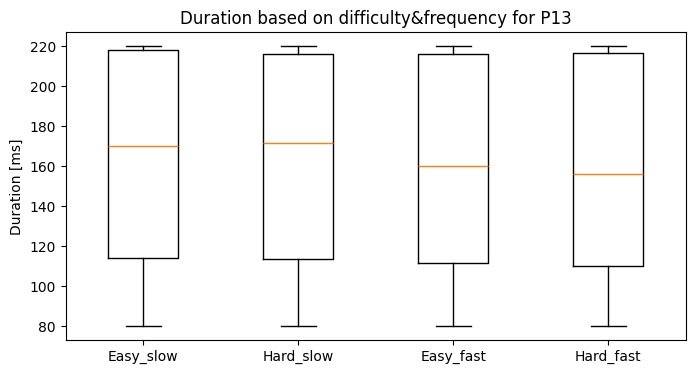

Easy_slow: 163.67 ms (~51.84)
Hard_slow: 163.45 ms (~51.53)
Easy_fast: 159.98 ms (~51.43)
Hard_fast: 157.55 ms (~50.91)


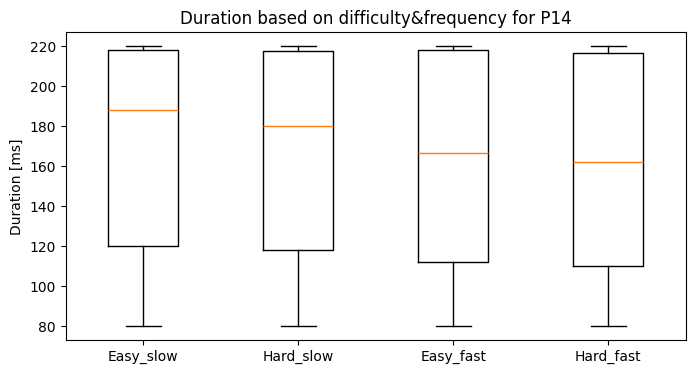

Easy_slow: 169.75 ms (~51.45)
Hard_slow: 167.66 ms (~51.28)
Easy_fast: 161.86 ms (~51.26)
Hard_fast: 160.33 ms (~51.01)


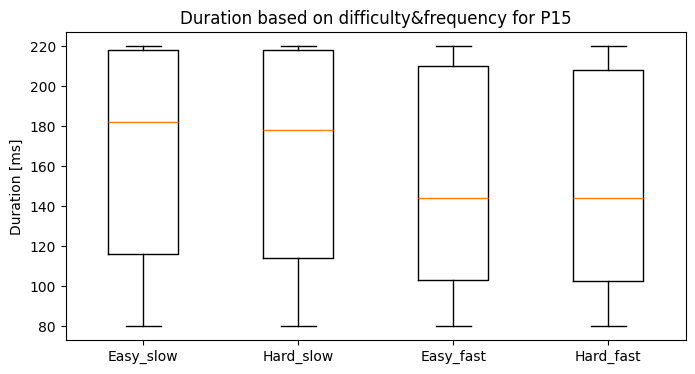

Easy_slow: 167.66 ms (~51.81)
Hard_slow: 166.08 ms (~52.31)
Easy_fast: 150.65 ms (~50.98)
Hard_fast: 150.39 ms (~50.41)


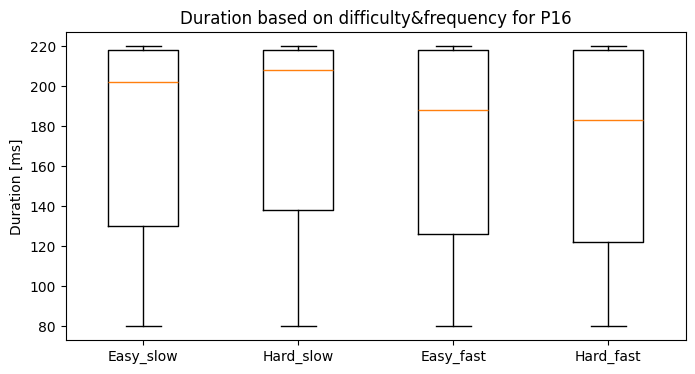

Easy_slow: 174.86 ms (~49.28)
Hard_slow: 177.98 ms (~48.05)
Easy_fast: 171.69 ms (~49.27)
Hard_fast: 168.72 ms (~49.9)


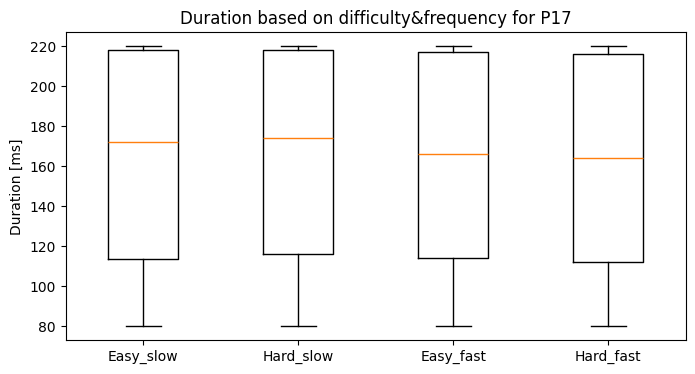

Easy_slow: 163.59 ms (~51.4)
Hard_slow: 165.38 ms (~50.81)
Easy_fast: 161.61 ms (~50.85)
Hard_fast: 161.15 ms (~50.88)


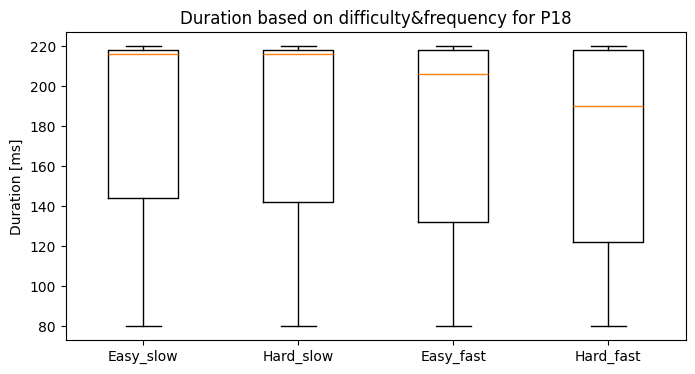

Easy_slow: 182.38 ms (~47.56)
Hard_slow: 181.56 ms (~47.67)
Easy_fast: 176.02 ms (~49.31)
Hard_fast: 170.64 ms (~50.88)


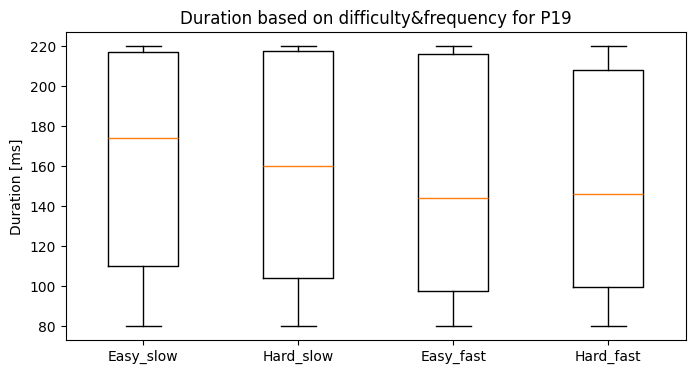

Easy_slow: 163.68 ms (~52.93)
Hard_slow: 158.09 ms (~52.72)
Easy_fast: 150.4 ms (~52.54)
Hard_fast: 150.22 ms (~51.74)


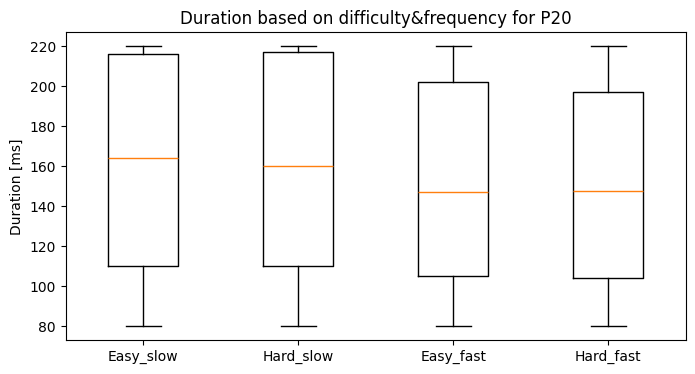

Easy_slow: 160.39 ms (~51.41)
Hard_slow: 158.95 ms (~50.52)
Easy_fast: 151.02 ms (~49.13)
Hard_fast: 150.4 ms (~48.25)


In [26]:
# Diameter data based on difficulty+frequency
for pid in participant_ids:
    unix_intervals_easy_slow = gui_df_easy_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    unix_intervals_hard_slow = gui_df_hard_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    unix_intervals_easy_fast = gui_df_easy_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    unix_intervals_hard_fast = gui_df_hard_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()

    duration_ddf = data['surf_fixation'].query(f"participant_id == {pid}").query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
    duration_df = duration_ddf.compute()

    # Get diameter intervals
    interval_mask_easy_slow = pd.Series(False, index=duration_df.index)
    interval_mask_hard_slow = pd.Series(False, index=duration_df.index)
    interval_mask_easy_fast = pd.Series(False, index=duration_df.index)
    interval_mask_hard_fast = pd.Series(False, index=duration_df.index)

    for start, _, end in unix_intervals_easy_slow:
        interval_mask_easy_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
    for start, _, end in unix_intervals_hard_slow:
        interval_mask_hard_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
    for start, _, end in unix_intervals_easy_fast:
        interval_mask_easy_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
    for start, _, end in unix_intervals_hard_fast:
        interval_mask_hard_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

    duration_df_easy_slow = duration_df.loc[interval_mask_easy_slow, 'duration']
    duration_df_hard_slow = duration_df.loc[interval_mask_hard_slow, 'duration']
    duration_df_easy_fast = duration_df.loc[interval_mask_easy_fast, 'duration']
    duration_df_hard_fast = duration_df.loc[interval_mask_hard_fast, 'duration']

    # Visualize
    mean_easy_slow = round(np.mean(duration_df_easy_slow), 2)
    mean_hard_slow = round(np.mean(duration_df_hard_slow), 2)
    mean_easy_fast = round(np.mean(duration_df_easy_fast), 2)
    mean_hard_fast = round(np.mean(duration_df_hard_fast), 2)
    std_easy_slow = round(np.std(duration_df_easy_slow), 2)
    std_hard_slow = round(np.std(duration_df_hard_slow), 2)
    std_easy_fast = round(np.std(duration_df_easy_fast), 2)
    std_hard_fast = round(np.std(duration_df_hard_fast), 2)

    plt.figure(figsize=(8, 4))
    plt.boxplot([duration_df_easy_slow, duration_df_hard_slow, duration_df_easy_fast, duration_df_hard_fast], whis = 1.5, showfliers=False)
    plt.title(f'Duration based on difficulty&frequency for P{pid}')
    plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
    plt.ylabel('Duration [ms]')
    plt.show()

    print(f"Easy_slow: {np.mean(mean_easy_slow)} ms (~{std_easy_slow})")
    print(f"Hard_slow: {np.mean(mean_hard_slow)} ms (~{std_hard_slow})")
    print(f"Easy_fast: {np.mean(mean_easy_fast)} ms (~{std_easy_fast})")
    print(f"Hard_fast: {np.mean(mean_hard_fast)} ms (~{std_hard_fast})")

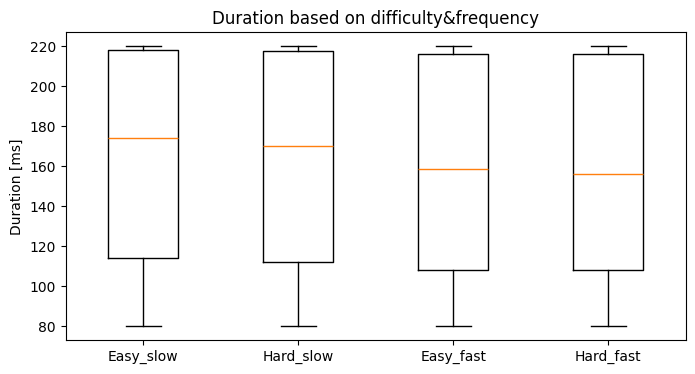

Easy_slow: 164.94 ms (~51.87)
Hard_slow: 163.35 ms (~51.72)
Easy_fast: 158.09 ms (~51.54)
Hard_fast: 156.78 ms (~51.2)


##### Difficulty&Frequency - Fixation duration (task-based)
- Slightly longer in slow conditions

In [47]:
# Diameter data based on difficulty+frequency
unix_task_intervals_easy_slow = gui_df_easy_slow[['clicked_timestamp', 'end_timestamp']]
unix_task_intervals_hard_slow = gui_df_hard_slow[['clicked_timestamp', 'end_timestamp']]
unix_task_intervals_easy_fast = gui_df_easy_fast[['clicked_timestamp', 'end_timestamp']]
unix_task_intervals_hard_fast = gui_df_hard_fast[['clicked_timestamp', 'end_timestamp']]

duration_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()

# Get diameter intervals
task_interval_mask_easy_slow = pd.Series(False, index=duration_df.index)
task_interval_mask_hard_slow = pd.Series(False, index=duration_df.index)
task_interval_mask_easy_fast = pd.Series(False, index=duration_df.index)
task_interval_mask_hard_fast = pd.Series(False, index=duration_df.index)

for start, end in unix_task_intervals_easy_slow.itertuples(index=False):
    task_interval_mask_easy_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_slow.itertuples(index=False):
    task_interval_mask_hard_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, end in unix_task_intervals_easy_fast.itertuples(index=False):
    task_interval_mask_easy_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_fast.itertuples(index=False):
    task_interval_mask_hard_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

duration_easy_slow = duration_df.loc[task_interval_mask_easy_slow, 'duration']
duration_hard_slow = duration_df.loc[task_interval_mask_hard_slow, 'duration']
duration_easy_fast = duration_df.loc[task_interval_mask_easy_fast, 'duration']
duration_hard_fast = duration_df.loc[task_interval_mask_hard_fast, 'duration']

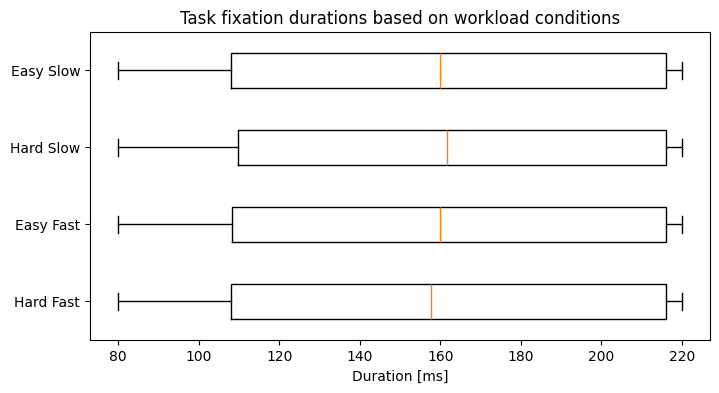

Easy Slow: 158.46 ms (~51.62)
Hard Slow: 159.25 ms (~51.25)
Easy Fast: 158.85 ms (~51.44)
Hard Fast: 157.39 ms (~51.16)


In [48]:
# Visualize
mean_easy_slow = round(np.mean(duration_easy_slow), 2)
mean_hard_slow = round(np.mean(duration_hard_slow), 2)
mean_easy_fast = round(np.mean(duration_easy_fast), 2)
mean_hard_fast = round(np.mean(duration_hard_fast), 2)
std_easy_slow = round(np.std(duration_easy_slow), 2)
std_hard_slow = round(np.std(duration_hard_slow), 2)
std_easy_fast = round(np.std(duration_easy_fast), 2)
std_hard_fast = round(np.std(duration_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([duration_hard_fast, duration_easy_fast, duration_hard_slow, duration_easy_slow], whis = 1.5, showfliers=False, vert=False)
plt.title(f'Task fixation durations based on workload conditions')
plt.yticks([1, 2, 3, 4], ['Hard Fast', 'Easy Fast', 'Hard Slow', 'Easy Slow',])
plt.xlabel('Duration [ms]')
plt.show()

print(f"Easy Slow: {np.mean(mean_easy_slow)} ms (~{std_easy_slow})")
print(f"Hard Slow: {np.mean(mean_hard_slow)} ms (~{std_hard_slow})")
print(f"Easy Fast: {np.mean(mean_easy_fast)} ms (~{std_easy_fast})")
print(f"Hard Fast: {np.mean(mean_hard_fast)} ms (~{std_hard_fast})")

##### Difficulty&Frequency - Fixation duration (task-based) (per participant)
- Slightly longer in slow conditions

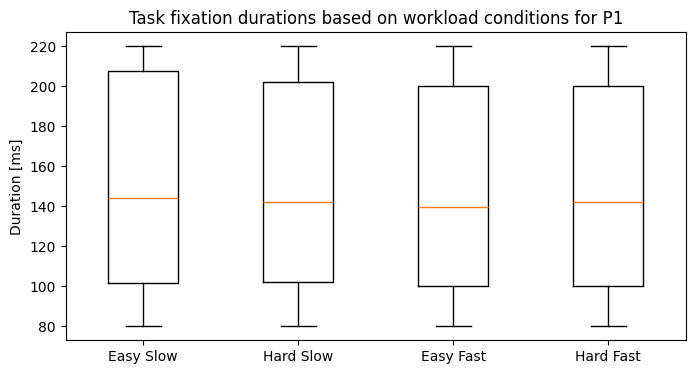

Easy_slow: 150.24 ms (~50.55)
Hard_slow: 149.39 ms (~50.12)
Easy_fast: 147.04 ms (~50.33)
Hard_fast: 148.35 ms (~49.92)


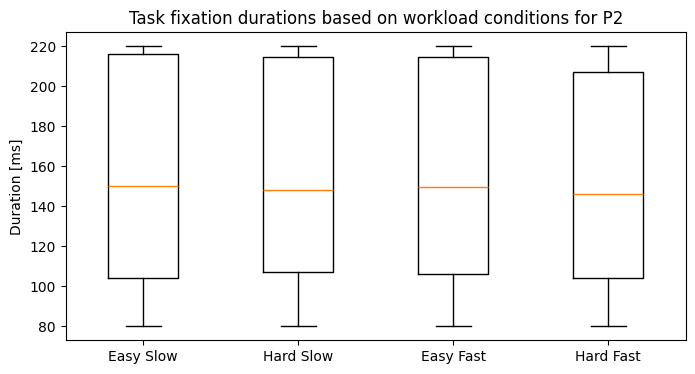

Easy_slow: 154.2 ms (~51.42)
Hard_slow: 153.09 ms (~50.27)
Easy_fast: 153.77 ms (~50.3)
Hard_fast: 151.2 ms (~49.91)


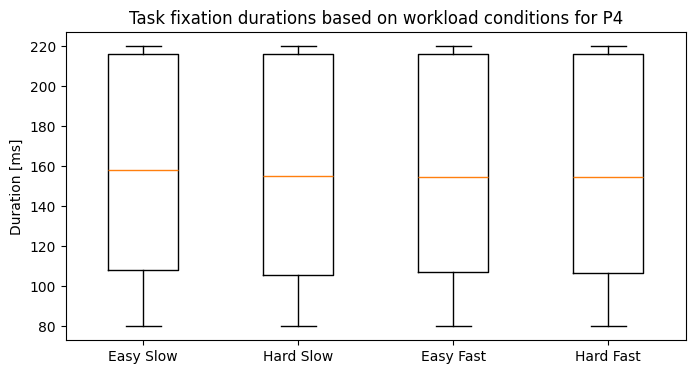

Easy_slow: 157.25 ms (~50.74)
Hard_slow: 155.48 ms (~51.09)
Easy_fast: 155.83 ms (~50.78)
Hard_fast: 155.78 ms (~50.63)


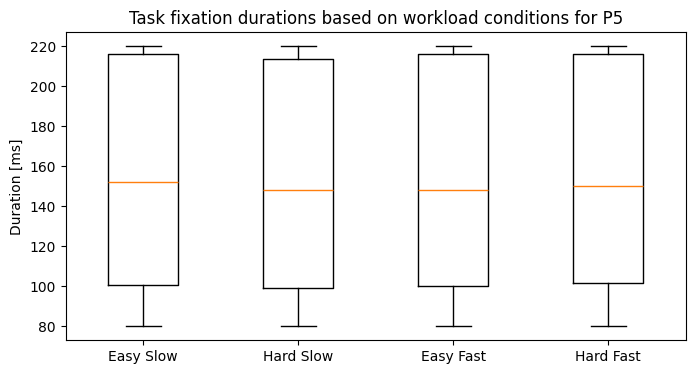

Easy_slow: 152.79 ms (~51.88)
Hard_slow: 150.96 ms (~51.98)
Easy_fast: 152.49 ms (~52.45)
Hard_fast: 152.79 ms (~51.81)


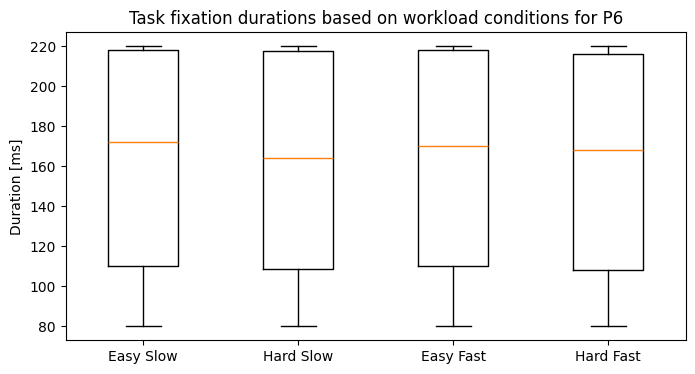

Easy_slow: 163.56 ms (~52.64)
Hard_slow: 160.54 ms (~52.64)
Easy_fast: 162.71 ms (~52.78)
Hard_fast: 161.56 ms (~52.49)


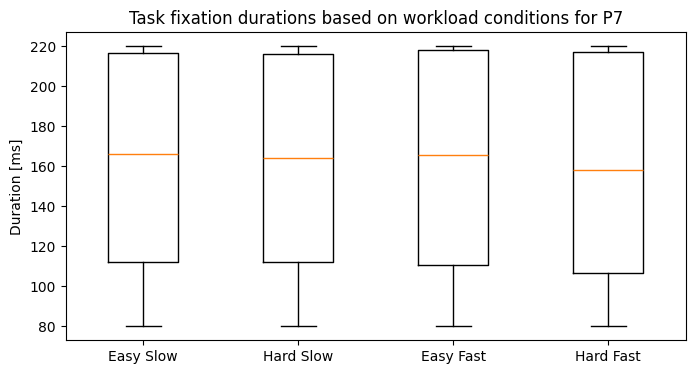

Easy_slow: 163.07 ms (~51.28)
Hard_slow: 161.7 ms (~50.4)
Easy_fast: 160.98 ms (~51.43)
Hard_fast: 157.44 ms (~51.8)


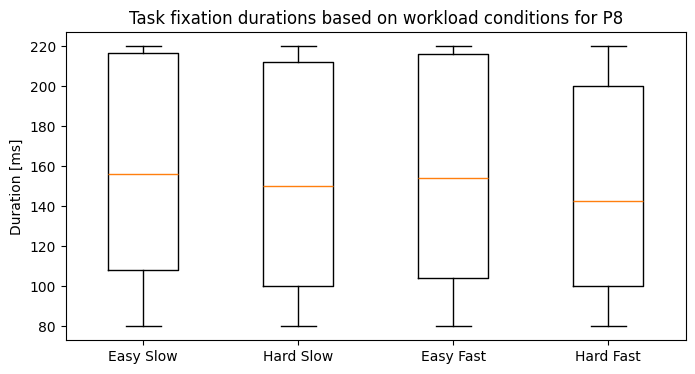

Easy_slow: 157.12 ms (~51.57)
Hard_slow: 151.79 ms (~51.28)
Easy_fast: 154.5 ms (~51.08)
Hard_fast: 148.83 ms (~50.6)


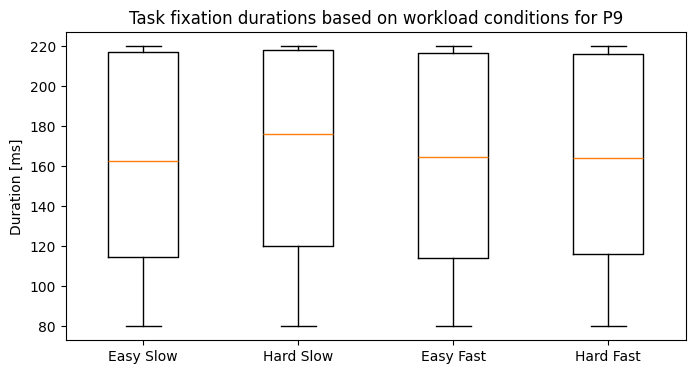

Easy_slow: 162.03 ms (~51.2)
Hard_slow: 166.67 ms (~49.3)
Easy_fast: 161.29 ms (~50.57)
Hard_fast: 161.78 ms (~50.33)


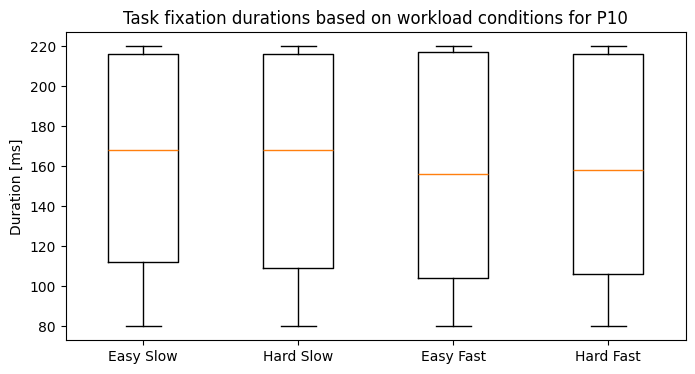

Easy_slow: 162.88 ms (~51.54)
Hard_slow: 161.59 ms (~52.34)
Easy_fast: 156.72 ms (~52.55)
Hard_fast: 157.65 ms (~52.3)


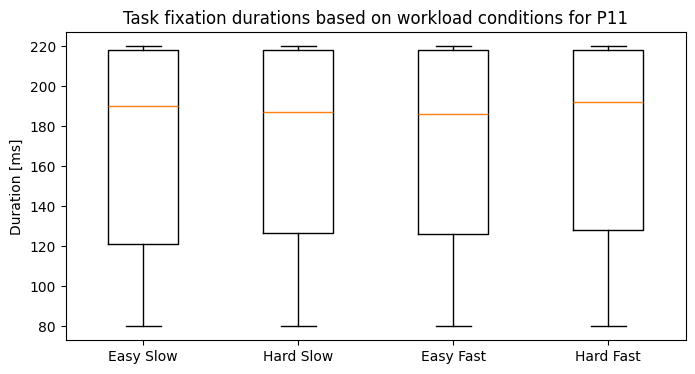

Easy_slow: 171.78 ms (~50.42)
Hard_slow: 171.22 ms (~49.16)
Easy_fast: 170.32 ms (~49.55)
Hard_fast: 172.42 ms (~48.99)


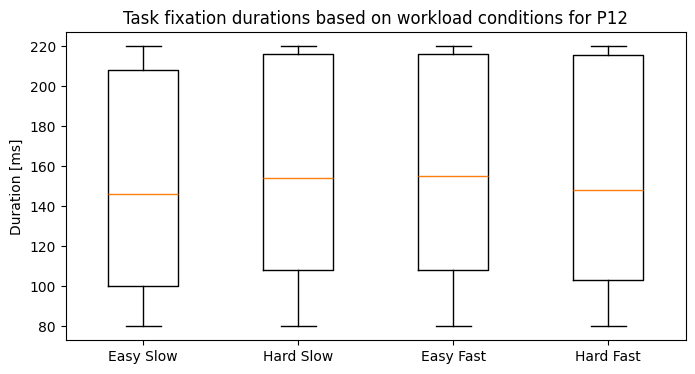

Easy_slow: 150.8 ms (~50.96)
Hard_slow: 155.64 ms (~50.16)
Easy_fast: 156.15 ms (~50.94)
Hard_fast: 152.29 ms (~50.86)


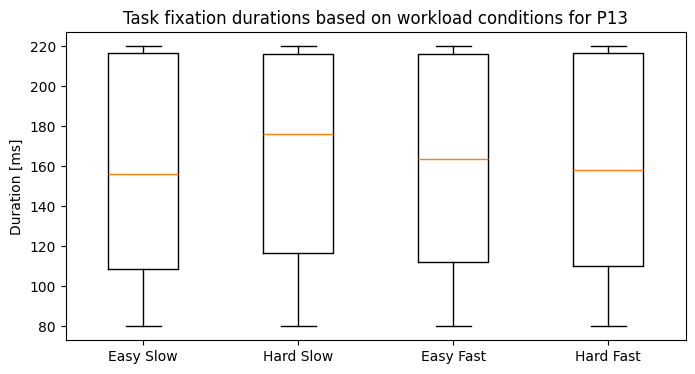

Easy_slow: 157.77 ms (~51.53)
Hard_slow: 166.3 ms (~50.79)
Easy_fast: 161.13 ms (~51.34)
Hard_fast: 158.62 ms (~51.0)


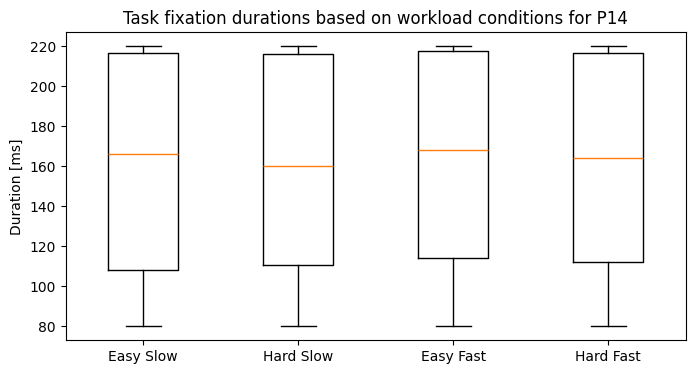

Easy_slow: 160.37 ms (~52.25)
Hard_slow: 159.44 ms (~51.15)
Easy_fast: 162.6 ms (~51.09)
Hard_fast: 160.95 ms (~51.04)


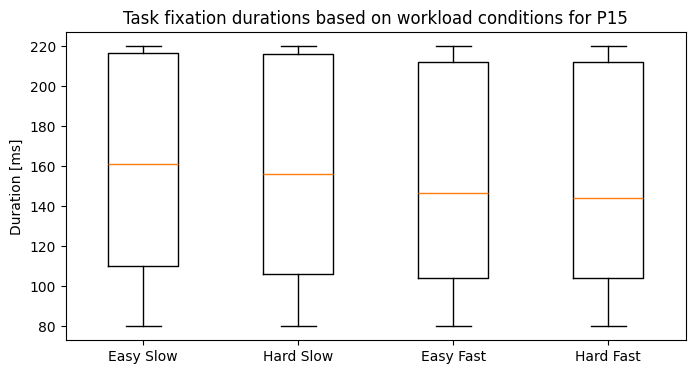

Easy_slow: 159.13 ms (~51.32)
Hard_slow: 156.23 ms (~51.45)
Easy_fast: 151.73 ms (~51.02)
Hard_fast: 151.28 ms (~50.41)


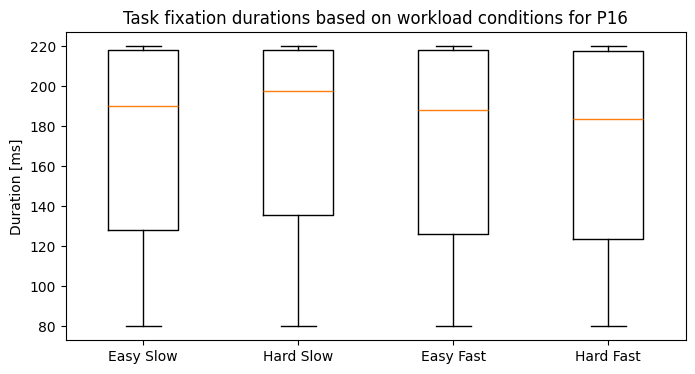

Easy_slow: 171.8 ms (~49.65)
Hard_slow: 175.75 ms (~48.01)
Easy_fast: 171.87 ms (~49.18)
Hard_fast: 169.09 ms (~49.71)


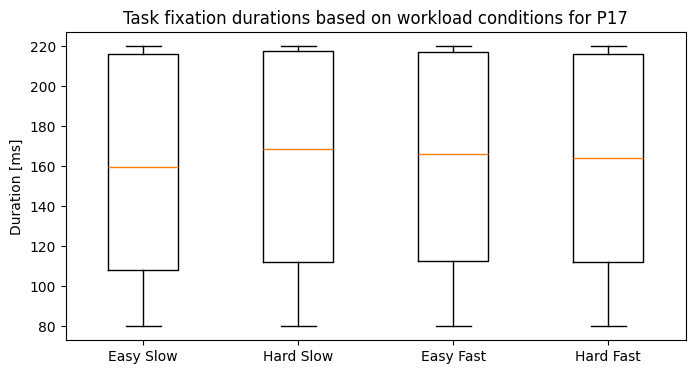

Easy_slow: 157.69 ms (~51.42)
Hard_slow: 162.73 ms (~51.5)
Easy_fast: 161.58 ms (~50.82)
Hard_fast: 160.84 ms (~50.74)


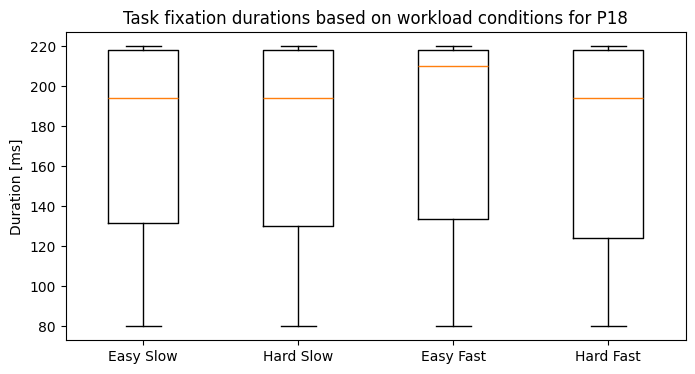

Easy_slow: 173.53 ms (~49.43)
Hard_slow: 173.64 ms (~48.72)
Easy_fast: 177.06 ms (~49.04)
Hard_fast: 172.25 ms (~50.47)


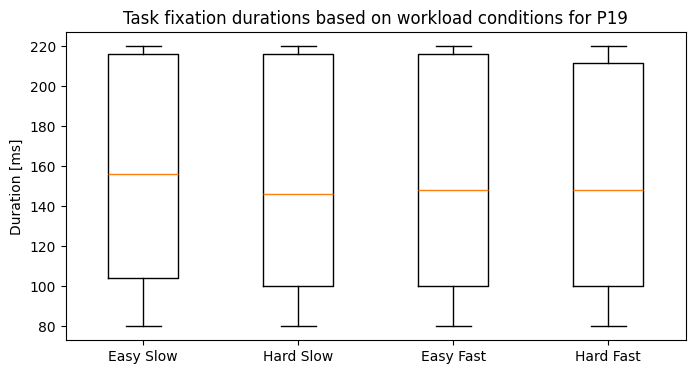

Easy_slow: 155.98 ms (~52.58)
Hard_slow: 152.05 ms (~51.98)
Easy_fast: 152.11 ms (~51.97)
Hard_fast: 151.43 ms (~51.78)


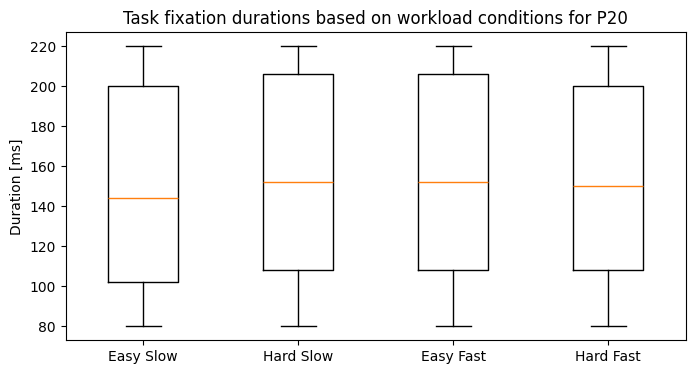

Easy_slow: 149.25 ms (~49.23)
Hard_slow: 153.69 ms (~48.77)
Easy_fast: 153.51 ms (~49.22)
Hard_fast: 152.52 ms (~48.15)


In [23]:
# Diameter data based on difficulty+frequency
for pid in participant_ids:
    unix_task_intervals_easy_slow = gui_df_easy_slow.query(f"participant_id == {pid}")[['clicked_timestamp', 'end_timestamp']]
    unix_task_intervals_hard_slow = gui_df_hard_slow.query(f"participant_id == {pid}")[['clicked_timestamp', 'end_timestamp']]
    unix_task_intervals_easy_fast = gui_df_easy_fast.query(f"participant_id == {pid}")[['clicked_timestamp', 'end_timestamp']]
    unix_task_intervals_hard_fast = gui_df_hard_fast.query(f"participant_id == {pid}")[['clicked_timestamp', 'end_timestamp']]

    duration_ddf = data['surf_fixation'].query(f"participant_id == {pid}").query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
    duration_df = duration_ddf.compute()

    # Get diameter intervals
    task_interval_mask_easy_slow = pd.Series(False, index=duration_df.index)
    task_interval_mask_hard_slow = pd.Series(False, index=duration_df.index)
    task_interval_mask_easy_fast = pd.Series(False, index=duration_df.index)
    task_interval_mask_hard_fast = pd.Series(False, index=duration_df.index)

    for start, end in unix_task_intervals_easy_slow.itertuples(index=False):
        task_interval_mask_easy_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
    for start, end in unix_task_intervals_hard_slow.itertuples(index=False):
        task_interval_mask_hard_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
    for start, end in unix_task_intervals_easy_fast.itertuples(index=False):
        task_interval_mask_easy_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
    for start, end in unix_task_intervals_hard_fast.itertuples(index=False):
        task_interval_mask_hard_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

    duration_easy_slow = duration_df.loc[task_interval_mask_easy_slow, 'duration']
    duration_hard_slow = duration_df.loc[task_interval_mask_hard_slow, 'duration']
    duration_easy_fast = duration_df.loc[task_interval_mask_easy_fast, 'duration']
    duration_hard_fast = duration_df.loc[task_interval_mask_hard_fast, 'duration']

    # Visualize
    mean_easy_slow = round(np.mean(duration_easy_slow), 2)
    mean_hard_slow = round(np.mean(duration_hard_slow), 2)
    mean_easy_fast = round(np.mean(duration_easy_fast), 2)
    mean_hard_fast = round(np.mean(duration_hard_fast), 2)
    std_easy_slow = round(np.std(duration_easy_slow), 2)
    std_hard_slow = round(np.std(duration_hard_slow), 2)
    std_easy_fast = round(np.std(duration_easy_fast), 2)
    std_hard_fast = round(np.std(duration_hard_fast), 2)

    plt.figure(figsize=(8, 4))
    plt.boxplot([duration_easy_slow, duration_hard_slow, duration_easy_fast, duration_hard_fast], whis = 1.5, showfliers=False)
    plt.title(f'Task fixation durations based on workload conditions for P{pid}')
    plt.xticks([1, 2, 3, 4], ['Easy Slow', 'Hard Slow', 'Easy Fast', 'Hard Fast'])
    plt.ylabel('Duration [ms]')
    plt.show()

    print(f"Easy_slow: {np.mean(mean_easy_slow)} ms (~{std_easy_slow})")
    print(f"Hard_slow: {np.mean(mean_hard_slow)} ms (~{std_hard_slow})")
    print(f"Easy_fast: {np.mean(mean_easy_fast)} ms (~{std_easy_fast})")
    print(f"Hard_fast: {np.mean(mean_hard_fast)} ms (~{std_hard_fast})")

##### Reaction time - Fixation duration
- Mixed results

In [50]:
# Fixation duration data based on reaction time
rt_gui_df = gui_df[['participant_id', 'start_timestamp', 'reaction_time', 'clicked_timestamp']].dropna()
duration_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_duration_df = duration_df.query(f"participant_id == {pid}")
    mean_durations = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['start_timestamp']
        end = row['clicked_timestamp']
        duration_in_interval = p_duration_df[(p_duration_df['start_timestamp_unix'] >= start) & 
                                             (p_duration_df['start_timestamp_unix'] <= end)]
        
        mean_duration = duration_in_interval['duration'].mean()
        mean_durations.append(mean_duration)
    
    p_rt_gui_df['mean_duration'] = mean_durations
    correlation = p_rt_gui_df['reaction_time'].corr(p_rt_gui_df['mean_duration'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: -0.03196635560694639
Std Correlation: 0.14572706979161806
    participant_id  correlation
0                1     0.145963
1                2    -0.087591
2                4     0.070589
3                5    -0.107906
4                6     0.156441
5                7    -0.110439
6                8     0.049382
7                9     0.080008
8               10     0.009865
9               11    -0.161891
10              12     0.098870
11              13     0.155175
12              14    -0.326433
13              15     0.074237
14              16    -0.042638
15              17    -0.096396
16              18    -0.211061
17              19    -0.287048
18              20    -0.016488


##### Completion time - Fixation duration
- Overall positive correlation: no

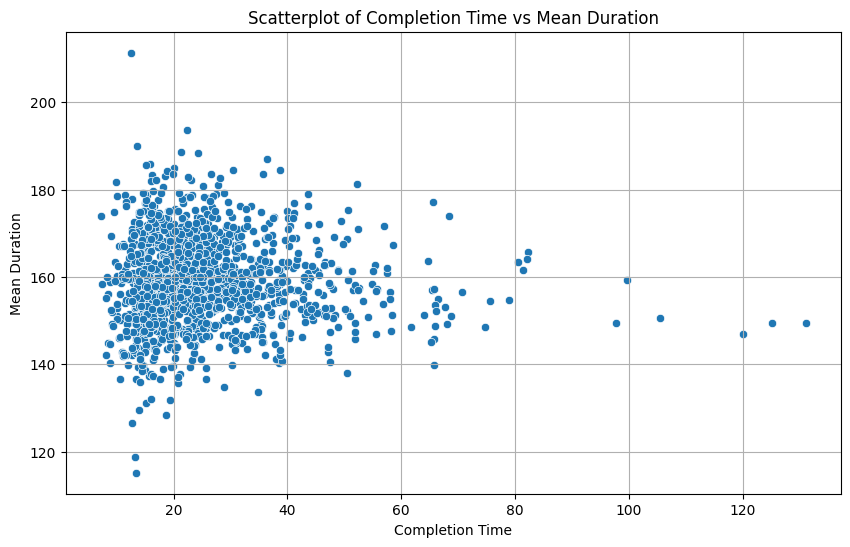

Mean Correlation: 0.13587461251313637
Std Correlation: 0.1392460657162926
    participant_id  correlation
0                1     0.142877
1                2    -0.265043
2                4     0.303655
3                5    -0.067546
4                6     0.256651
5                7     0.147626
6                8     0.242955
7                9     0.150062
8               10     0.202962
9               11     0.158961
10              12     0.246203
11              13     0.209444
12              14     0.055538
13              15     0.211230
14              16     0.102299
15              17     0.246200
16              18     0.111198
17              19    -0.065423
18              20     0.191768


In [9]:
# Fixation duration data based on completion time
rt_gui_df = gui_df[['participant_id', 'clicked_timestamp', 'completion_time', 'end_timestamp']].dropna()
duration_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()
correlation_results = []

# Prepare lists to gather all completion times and mean durations for plotting
all_completion_times = []
all_mean_durations = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_duration_df = duration_df.query(f"participant_id == {pid}")
    mean_durations = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['clicked_timestamp']
        end = row['end_timestamp']
        duration_in_interval = p_duration_df[(p_duration_df['start_timestamp_unix'] >= start) & 
                                             (p_duration_df['start_timestamp_unix'] <= end)]
        
        mean_duration = duration_in_interval['duration'].mean()
        mean_durations.append(mean_duration)
    
    p_rt_gui_df['mean_duration'] = mean_durations
    correlation = p_rt_gui_df['completion_time'].corr(p_rt_gui_df['mean_duration'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})
    
    # Gather data for scatterplot
    all_completion_times.extend(p_rt_gui_df['completion_time'])
    all_mean_durations.extend(p_rt_gui_df['mean_duration'])

# Create a DataFrame for scatterplot data
scatter_df = pd.DataFrame({
    'Completion Time': all_completion_times,
    'Mean Duration': all_mean_durations
})

# Plot scatterplot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=scatter_df, x='Completion Time', y='Mean Duration')
plt.title('Scatterplot of Completion Time vs Mean Duration')
plt.xlabel('Completion Time')
plt.ylabel('Mean Duration')
plt.grid(True)
plt.show()

# Create the correlation DataFrame and print results
correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


##### Difficulty - Fixation dispersion
- No correlation

In [52]:
# Dispersion data based on difficulty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

dispersion_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()

# Get dispersion intervals
interval_mask_easy = pd.Series(False, index=dispersion_df.index)
interval_mask_hard = pd.Series(False, index=dispersion_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)

dispersion_df_easy = dispersion_df.loc[interval_mask_easy, 'dispersion']
dispersion_df_hard = dispersion_df.loc[interval_mask_hard, 'dispersion']

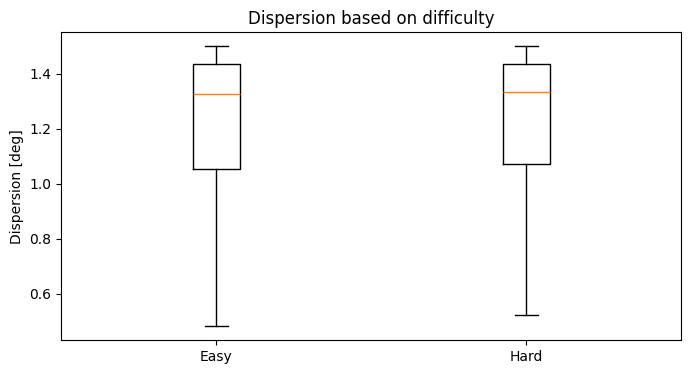

Easy: 1.22 deg (~0.27)
Hard: 1.23 deg (~0.27)


In [53]:
# Visualize
mean_easy = round(np.mean(dispersion_df_easy), 2)
mean_hard = round(np.mean(dispersion_df_hard), 2)
std_easy = round(np.std(dispersion_df_easy), 2)
std_hard = round(np.std(dispersion_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([dispersion_df_easy, dispersion_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Dispersion based on difficulty')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Dispersion [deg]')
plt.show()

print(f"Easy: {np.mean(mean_easy)} deg (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} deg (~{std_hard})")

##### Frequency - Fixation dispersion
- Very slightly more spread in fast condition

In [54]:
# Dispersion data based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

dispersion_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()

# Get dispersion intervals
interval_mask_slow = pd.Series(False, index=dispersion_df.index)
interval_mask_fast = pd.Series(False, index=dispersion_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)

dispersion_df_slow = dispersion_df.loc[interval_mask_slow, 'dispersion']
dispersion_df_fast = dispersion_df.loc[interval_mask_fast, 'dispersion']

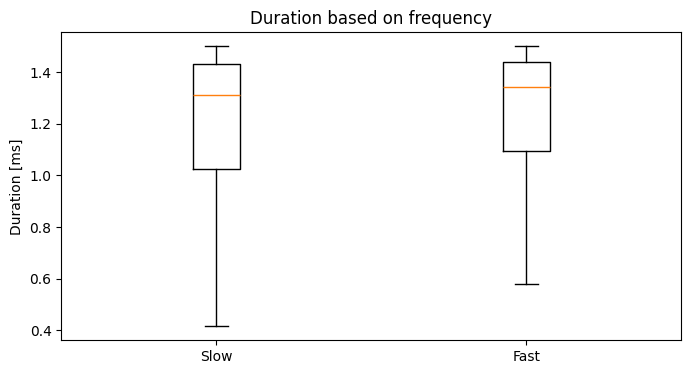

Slow: 1.2 ms (~0.28)
Fast: 1.24 ms (~0.26)


In [55]:
# Visualize
mean_slow = round(np.mean(dispersion_df_slow), 2)
mean_fast = round(np.mean(dispersion_df_fast), 2)
std_slow = round(np.std(dispersion_df_slow), 2)
std_fast = round(np.std(dispersion_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([dispersion_df_slow, dispersion_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on frequency')
plt.xticks([1, 2], ['Slow', 'Fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Slow: {np.mean(mean_slow)} ms (~{std_slow})")
print(f"Fast: {np.mean(mean_fast)} ms (~{std_fast})")

##### Difficulty&Frequency - Fixation dispersion
- Very slightly more spread in fast condition

In [56]:
# Dispersion data based on difficulty+frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

dispersion_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()

# Get dispersion intervals
interval_mask_easy_slow = pd.Series(False, index=dispersion_df.index)
interval_mask_hard_slow = pd.Series(False, index=dispersion_df.index)
interval_mask_easy_fast = pd.Series(False, index=dispersion_df.index)
interval_mask_hard_fast = pd.Series(False, index=dispersion_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)

dispersion_df_easy_slow = dispersion_df.loc[interval_mask_easy_slow, 'dispersion']
dispersion_df_hard_slow = dispersion_df.loc[interval_mask_hard_slow, 'dispersion']
dispersion_df_easy_fast = dispersion_df.loc[interval_mask_easy_fast, 'dispersion']
dispersion_df_hard_fast = dispersion_df.loc[interval_mask_hard_fast, 'dispersion']

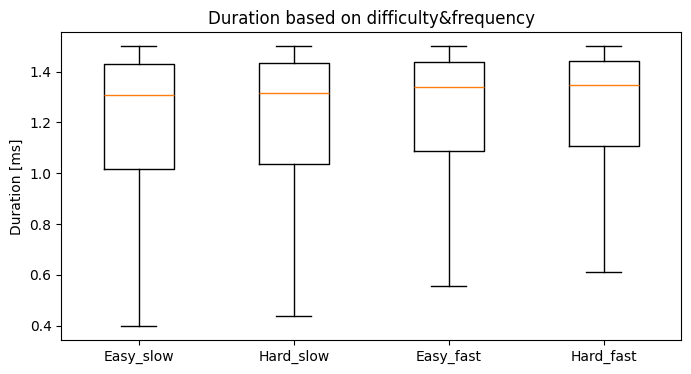

Easy_slow: 1.2 ms (~0.28)
Hard_slow: 1.21 ms (~0.28)
Easy_fast: 1.23 ms (~0.26)
Hard_fast: 1.24 ms (~0.25)


In [57]:
# Visualize
mean_easy_slow = round(np.mean(dispersion_df_easy_slow), 2)
mean_hard_slow = round(np.mean(dispersion_df_hard_slow), 2)
mean_easy_fast = round(np.mean(dispersion_df_easy_fast), 2)
mean_hard_fast = round(np.mean(dispersion_df_hard_fast), 2)
std_easy_slow = round(np.std(dispersion_df_easy_slow), 2)
std_hard_slow = round(np.std(dispersion_df_hard_slow), 2)
std_easy_fast = round(np.std(dispersion_df_easy_fast), 2)
std_hard_fast = round(np.std(dispersion_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([dispersion_df_easy_slow, dispersion_df_hard_slow, dispersion_df_easy_fast, dispersion_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} ms (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} ms (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} ms (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} ms (~{std_hard_fast})")

##### Reaction time - Fixation dispersion
- No correlation, mixed results
- Positive in: P05, P14, P17, P19
- Neutral in: P01, P02, P07, P10, P15, P16, P18, P20
- Negative in: P04, P06, P08, P09, P11, P12, P13

In [58]:
# Fixation dispersion data based on reaction time
rt_gui_df = gui_df[['participant_id', 'start_timestamp', 'reaction_time', 'clicked_timestamp']].dropna()
dispersion_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_dispersion_df = dispersion_df.query(f"participant_id == {pid}")
    mean_dispersions = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['start_timestamp']
        end = row['clicked_timestamp']
        dispersion_in_interval = p_dispersion_df[(p_dispersion_df['start_timestamp_unix'] >= start) & 
                                             (p_dispersion_df['start_timestamp_unix'] <= end)]
        
        mean_dispersion = dispersion_in_interval['dispersion'].mean()
        mean_dispersions.append(mean_dispersion)
    
    p_rt_gui_df['mean_dispersion'] = mean_dispersions
    correlation = p_rt_gui_df['reaction_time'].corr(p_rt_gui_df['mean_dispersion'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: 0.005541792202122565
Std Correlation: 0.14869224682980994
    participant_id  correlation
0                1     0.018927
1                2     0.074336
2                4    -0.106750
3                5     0.152654
4                6    -0.118884
5                7     0.102597
6                8    -0.121569
7                9    -0.184345
8               10     0.068915
9               11    -0.142729
10              12    -0.104491
11              13    -0.176351
12              14     0.176112
13              15    -0.101684
14              16     0.007044
15              17     0.316854
16              18    -0.013486
17              19     0.274170
18              20    -0.016026


##### Completion time - Fixation dispersion
- No correlation, mixed results
- Positive in: P02, P18, P19
- Neutral in: P07, P11, P13, P14, P15, P16, P17
- Negative in: P01, P04, P05, P06, P08, P09, P10, P12, P20

In [59]:
# Fixation dispersion data based on completion time
rt_gui_df = gui_df[['participant_id', 'clicked_timestamp', 'completion_time', 'end_timestamp']].dropna()
dispersion_ddf = data['surf_fixation'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_dispersion_df = dispersion_df.query(f"participant_id == {pid}")
    mean_dispersions = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['clicked_timestamp']
        end = row['end_timestamp']
        dispersion_in_interval = p_dispersion_df[(p_dispersion_df['start_timestamp_unix'] >= start) & 
                                             (p_dispersion_df['start_timestamp_unix'] <= end)]
        
        mean_dispersion = dispersion_in_interval['dispersion'].mean()
        mean_dispersions.append(mean_dispersion)
    
    p_rt_gui_df['mean_dispersion'] = mean_dispersions
    correlation = p_rt_gui_df['completion_time'].corr(p_rt_gui_df['mean_dispersion'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: -0.05459320006236383
Std Correlation: 0.14287803201709767
    participant_id  correlation
0                1    -0.251154
1                2     0.220028
2                4    -0.180203
3                5    -0.126588
4                6    -0.149984
5                7     0.069888
6                8    -0.070033
7                9    -0.133211
8               10    -0.206407
9               11     0.092672
10              12    -0.196594
11              13     0.061359
12              14    -0.051465
13              15    -0.083158
14              16    -0.001841
15              17     0.024034
16              18     0.107432
17              19     0.125910
18              20    -0.287957


### 3. Gui-Ocular Visualization
Heatmap, Blink rate, Diameter, Difficulty, Frequency

In [7]:
# Define variables
# Difficulty
easy_block = [1, 2, 5, 6]
hard_block = [3, 4, 7, 8]

# Frequency
slow_block = [1, 3, 5, 7]
fast_block = [2, 4, 6, 8]

# Difficulty+Frequency
easy_slow_block = [1, 5]
easy_fast_block = [2, 6]
hard_slow_block = [3, 7]
hard_fast_block = [4, 8]

In [8]:
# Create gui dfs
gui_df_easy = gui_df[gui_df['block_type'].isin(easy_block)]
gui_df_hard = gui_df[gui_df['block_type'].isin(hard_block)]

gui_df_slow = gui_df[gui_df['block_type'].isin(slow_block)]
gui_df_fast = gui_df[gui_df['block_type'].isin(fast_block)]

gui_df_easy_slow = gui_df[gui_df['block_type'].isin(easy_slow_block)]
gui_df_hard_slow = gui_df[gui_df['block_type'].isin(hard_slow_block)]
gui_df_easy_fast = gui_df[gui_df['block_type'].isin(easy_fast_block)]
gui_df_hard_fast = gui_df[gui_df['block_type'].isin(hard_fast_block)]

##### Fixation heatmap by Difficulty
- Hard: fixations focused in the center part of the screen (explanatory text)
- Easy: fixations spread in other interest areas such as warning box, and map

In [62]:
# Heatmap based on difficuty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

fixation_ddf = data['surf_fixation'].query("on_surf == True"). loc[:, ['participant_id', 'start_timestamp_unix', 'norm_pos_x', 'norm_pos_y']].dropna()
fixation_df = fixation_ddf.compute()
heatmap_df = fixation_df[(fixation_df['norm_pos_x'] >= 0) & (fixation_df['norm_pos_x'] <= 1) & (fixation_df['norm_pos_y'] >= 0) & (fixation_df['norm_pos_y'] <= 1)]

# Get heatmap intervals
interval_mask_easy = pd.Series(False, index=heatmap_df.index)
interval_mask_hard = pd.Series(False, index=heatmap_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)

heatmap_df_easy = heatmap_df.loc[interval_mask_easy, :]
heatmap_df_hard = heatmap_df.loc[interval_mask_hard, :]

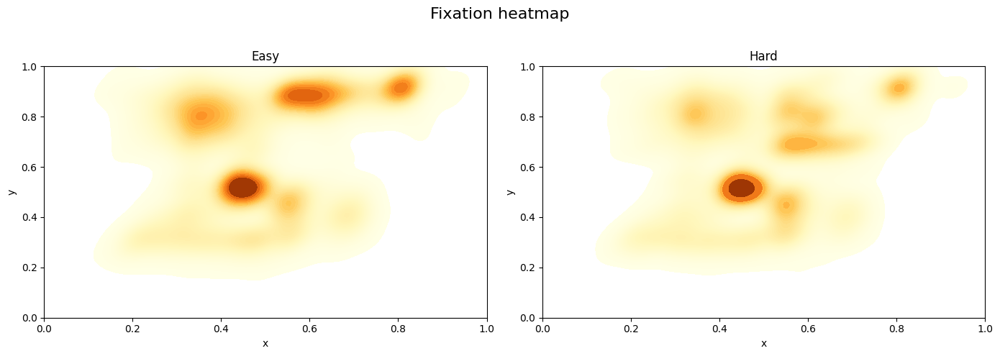

In [63]:
# Overall heatmap
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
# Easy condition heatmap
sns.kdeplot(
    x=heatmap_df_easy['norm_pos_x'], 
    y=heatmap_df_easy['norm_pos_y'],
    levels=np.logspace(-2, 0, 100),
    hue_norm=(0,1),
    fill=True, 
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[0],
)
axes[0].set_title('Easy')
axes[0].set_xlim(0, 1)
axes[0].set_ylim(0, 1)
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')

# Hard condition heatmap
sns.kdeplot(
    x=heatmap_df_hard['norm_pos_x'], 
    y=heatmap_df_hard['norm_pos_y'],
    fill=True, 
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[1],
)
axes[1].set_title('Hard')
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')

# Add a unique title for the entire figure
fig.suptitle('Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()

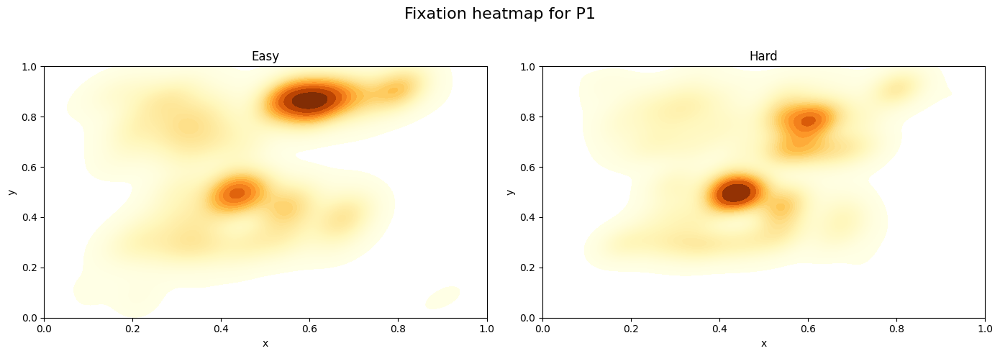

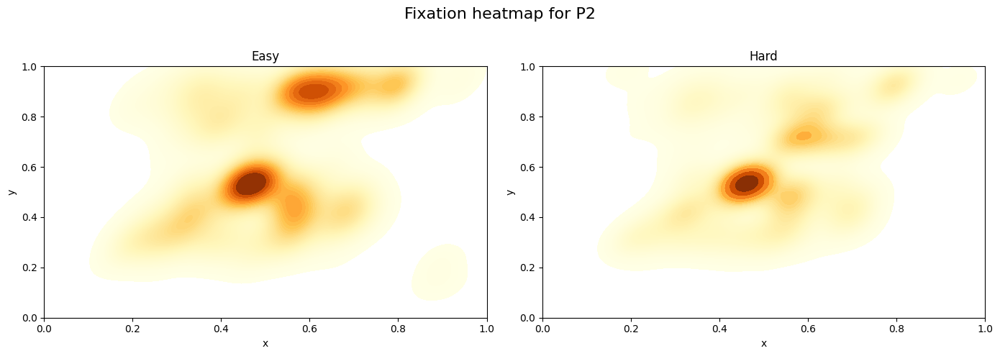

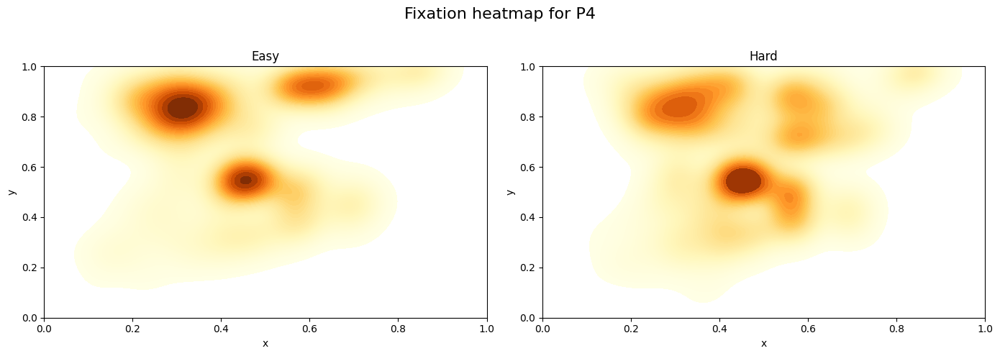

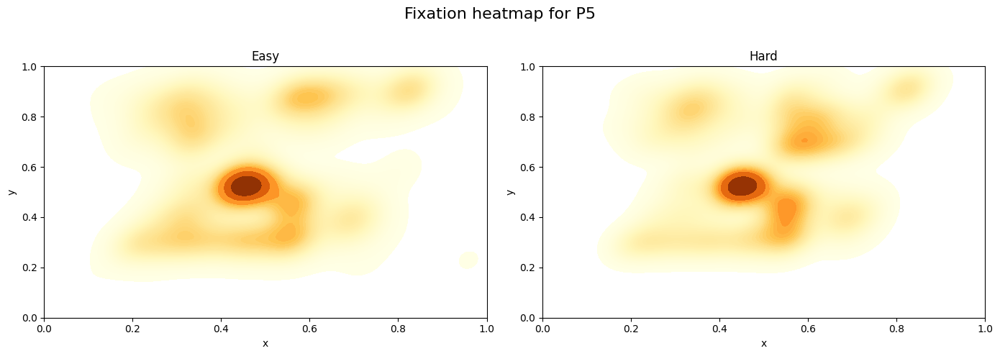

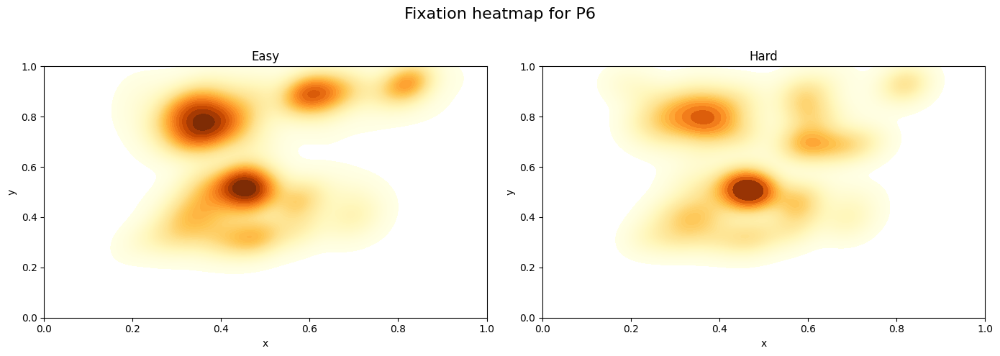

...

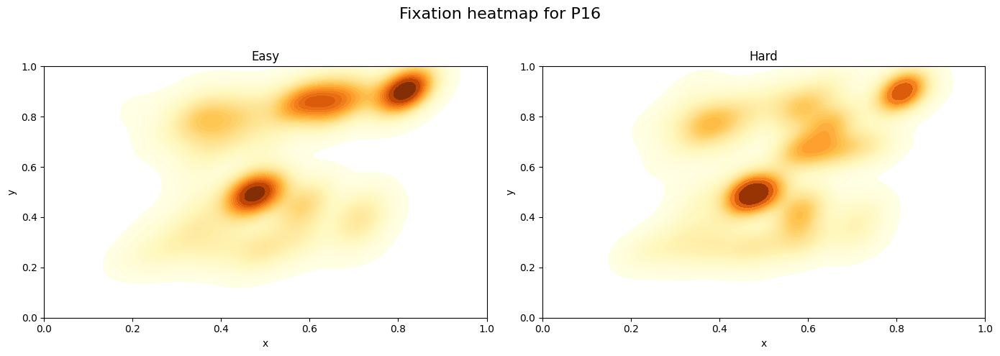

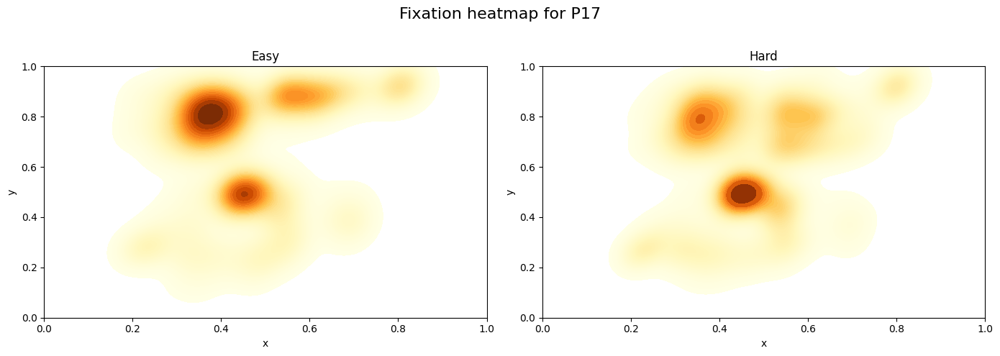

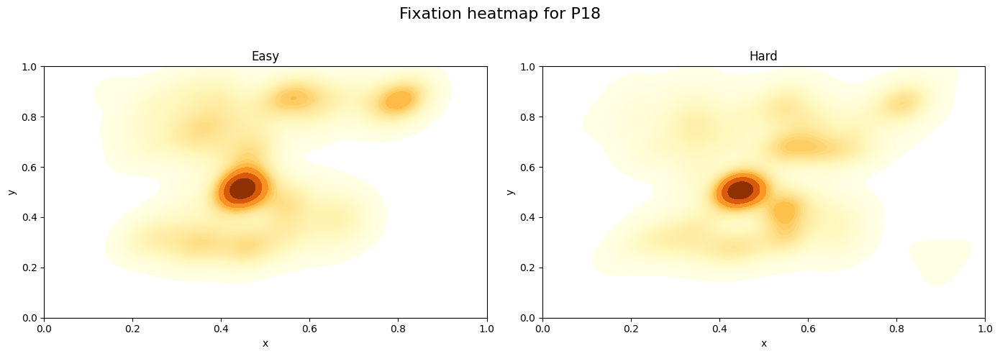

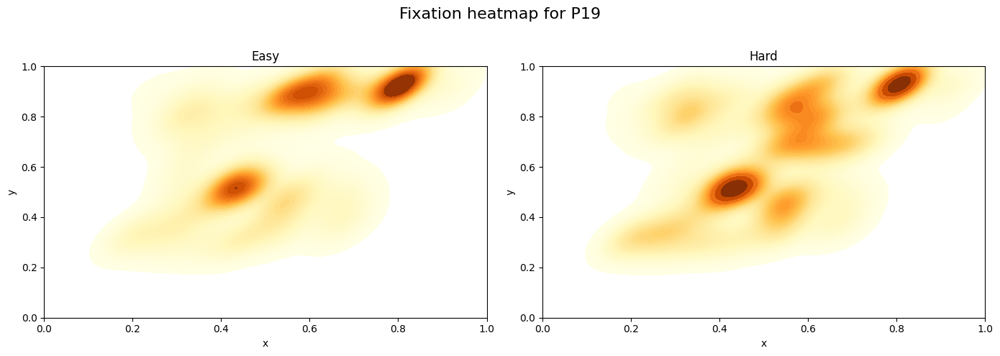

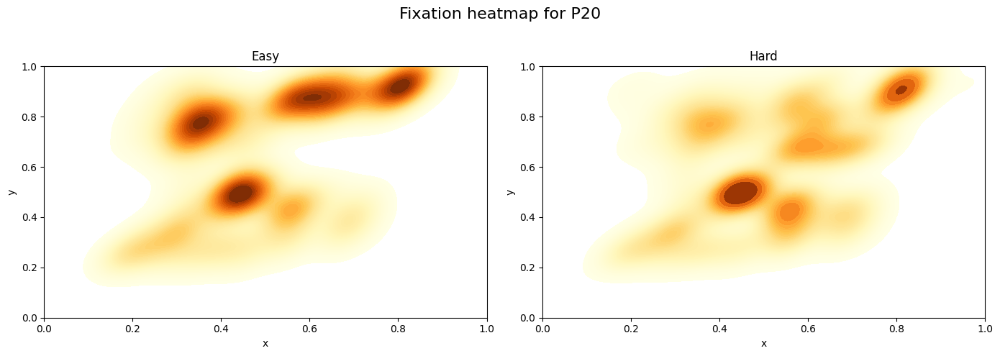

In [64]:
for pid in participant_ids:
    participant_df_easy = heatmap_df_easy.query(f"participant_id == {pid}")
    participant_df_hard = heatmap_df_hard.query(f"participant_id == {pid}")

    # Create subplots with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    # Easy condition heatmap
    sns.kdeplot(
        x=participant_df_easy['norm_pos_x'], 
        y=participant_df_easy['norm_pos_y'],
        levels=np.logspace(-2, 0, 100),
        hue_norm=(0,1),
        fill=True, 
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        ax=axes[0],
    )
    axes[0].set_title('Easy')
    axes[0].set_xlim(0, 1)
    axes[0].set_ylim(0, 1)
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')

    # Hard condition heatmap
    sns.kdeplot(
        x=participant_df_hard['norm_pos_x'], 
        y=participant_df_hard['norm_pos_y'],
        fill=True, 
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        ax=axes[1],
    )
    axes[1].set_title('Hard')
    axes[1].set_xlim(0, 1)
    axes[1].set_ylim(0, 1)
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('y')

    # Add a unique title for the entire figure
    fig.suptitle(f'Fixation heatmap for P{pid}', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()

##### Fixation heatmap by Frequency
- Fast: fixations focused in the centered part of the screen (explanatory text)
- Slow: besides the center (not always tho), also other areas are fixated often such as warning box and map (time-filling techniques?)

In [65]:
# Heatmap based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

fixation_ddf = data['surf_fixation'].query("on_surf == True"). loc[:, ['participant_id', 'start_timestamp_unix', 'norm_pos_x', 'norm_pos_y']].dropna()
fixation_df = fixation_ddf.compute()
heatmap_df = fixation_df[(fixation_df['norm_pos_x'] >= 0) & (fixation_df['norm_pos_x'] <= 1) & (fixation_df['norm_pos_y'] >= 0) & (fixation_df['norm_pos_y'] <= 1)]

# Get heatmap intervals
interval_mask_slow = pd.Series(False, index=heatmap_df.index)
interval_mask_fast = pd.Series(False, index=heatmap_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)

heatmap_df_slow = heatmap_df.loc[interval_mask_slow, :]
heatmap_df_fast = heatmap_df.loc[interval_mask_fast, :]

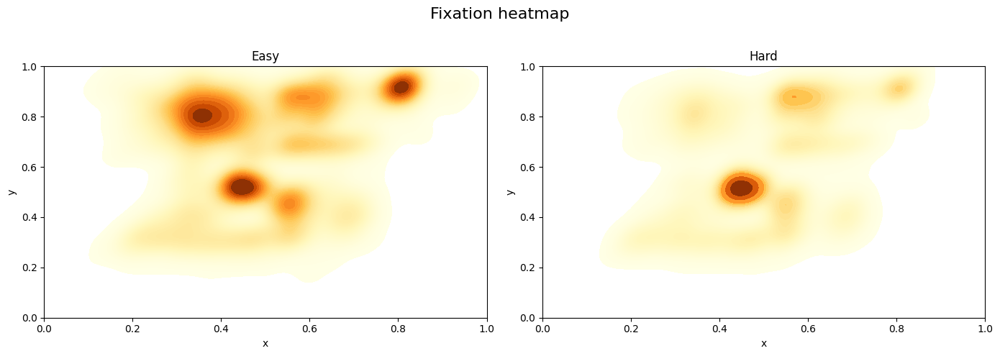

In [66]:
# Overall heatmap
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
# Easy condition heatmap
sns.kdeplot(
    x=heatmap_df_slow['norm_pos_x'], 
    y=heatmap_df_slow['norm_pos_y'],
    levels=np.logspace(-2, 0, 100),
    hue_norm=(0,1),
    fill=True, 
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[0],
)
axes[0].set_title('Easy')
axes[0].set_xlim(0, 1)
axes[0].set_ylim(0, 1)
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')

# Hard condition heatmap
sns.kdeplot(
    x=heatmap_df_fast['norm_pos_x'], 
    y=heatmap_df_fast['norm_pos_y'],
    fill=True, 
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[1],
)
axes[1].set_title('Hard')
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')

# Add a unique title for the entire figure
fig.suptitle('Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()

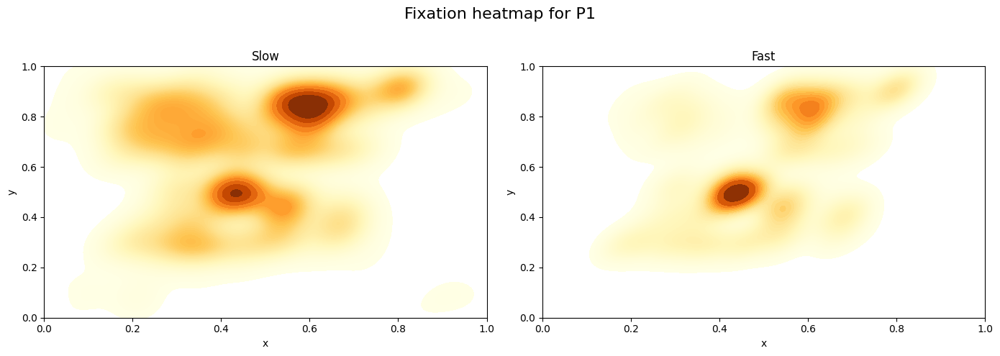

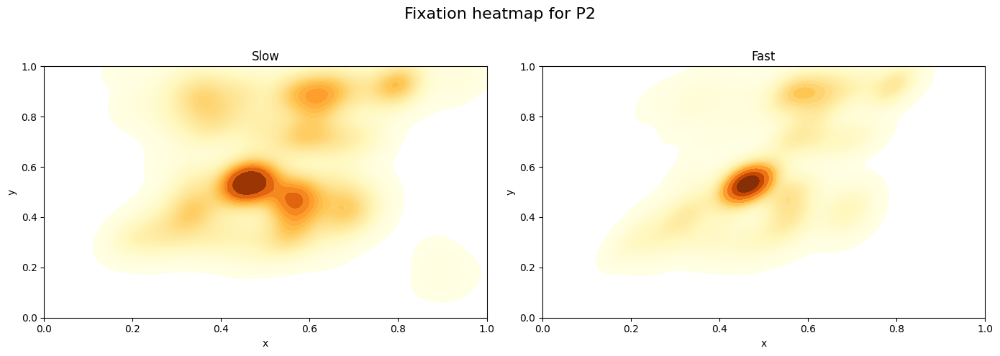

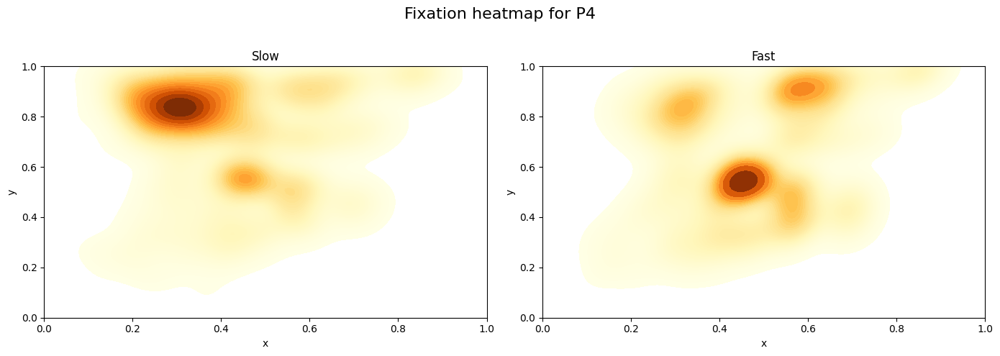

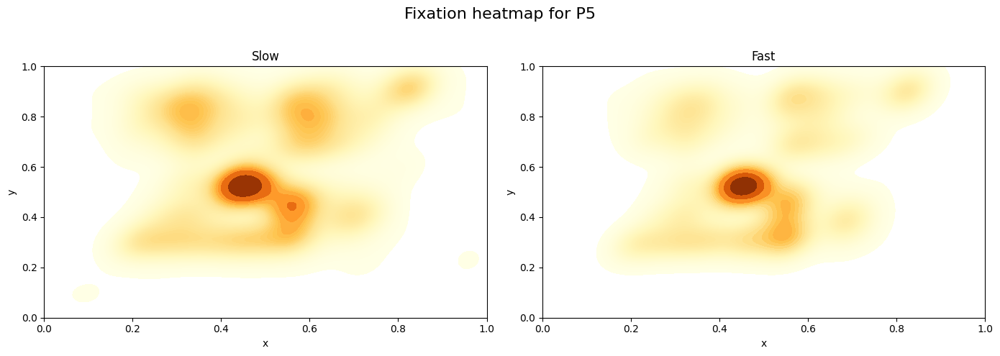

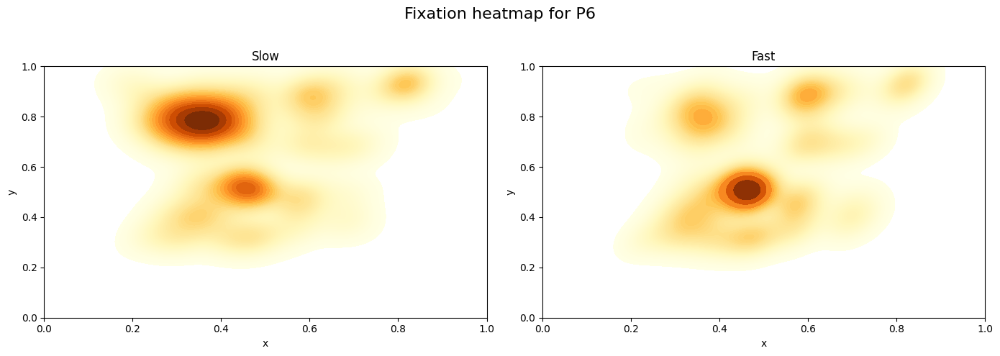

...

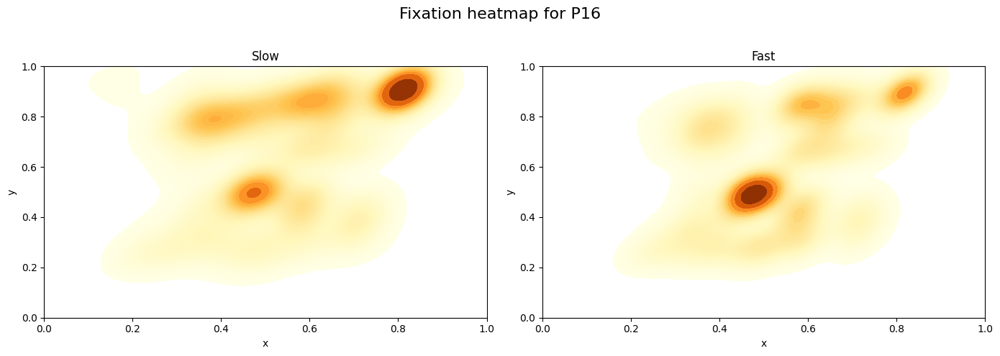

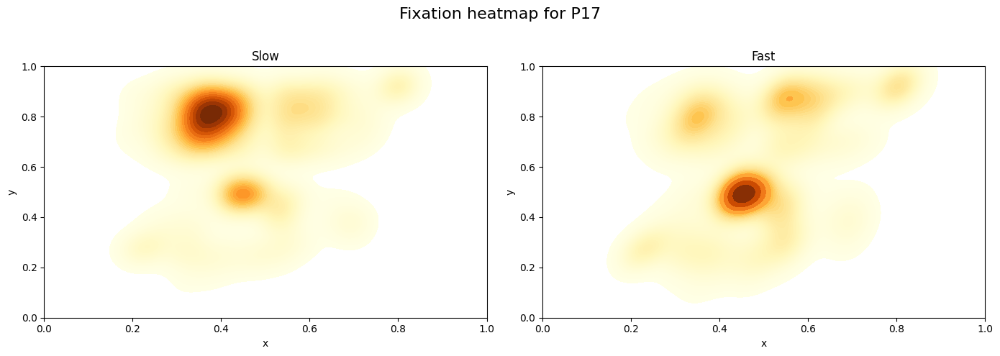

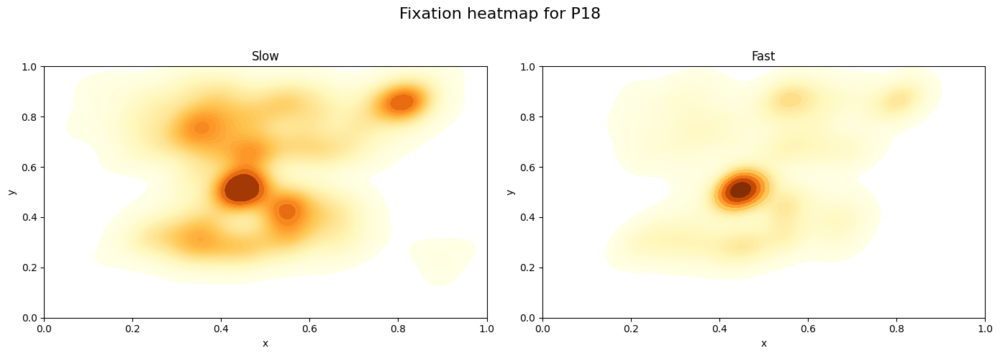

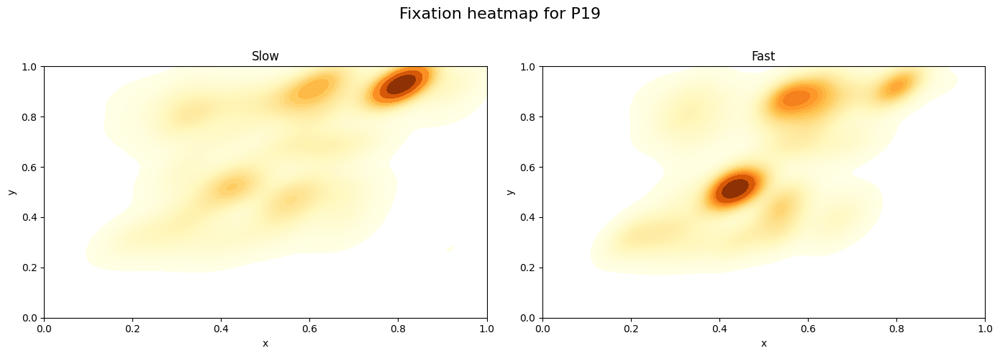

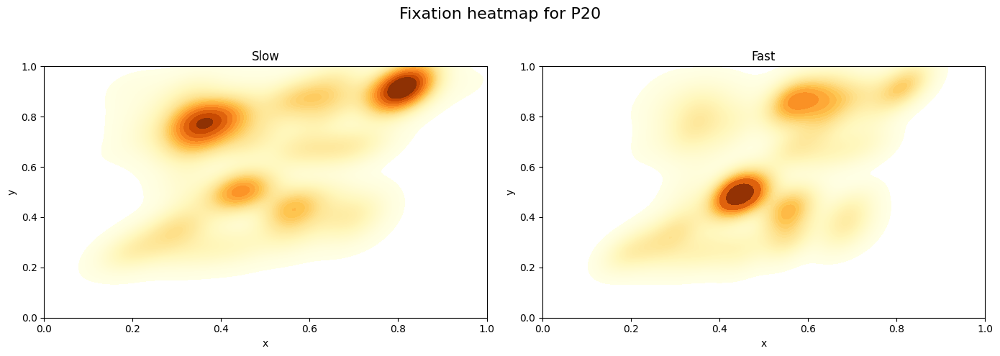

In [67]:
for pid in participant_ids:
    participant_df_slow = heatmap_df_slow.query(f"participant_id == {pid}")
    participant_df_fast = heatmap_df_fast.query(f"participant_id == {pid}")

    # Create subplots with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # slow condition heatmap
    sns.kdeplot(
        x=participant_df_slow['norm_pos_x'], 
        y=participant_df_slow['norm_pos_y'],
        fill=True, 
        levels=np.logspace(-2, 0, 100),
        hue_norm=(0,1),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[0],
        common_norm=True
    )
    axes[0].set_title('Slow')
    axes[0].set_xlim(0, 1)
    axes[0].set_ylim(0, 1)
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')

    # fast condition heatmap
    sns.kdeplot(
        x=participant_df_fast['norm_pos_x'], 
        y=participant_df_fast['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[1],
        common_norm=True
    )
    axes[1].set_title('Fast')
    axes[1].set_xlim(0, 1)
    axes[1].set_ylim(0, 1)
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('y')

    # Add a unique title for the entire figure
    fig.suptitle(f'Fixation heatmap for P{pid}', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()

##### Fixation heatmap by Difficulty&Frequency
- Easy_slow: areas rather than center are taken into consideration such as warning box and map (time-fillers?)
- Hard_slow: similar to easy_slow but with mre fixations also at the center (time-fillers + reading)
- Easy_fast: similar to hard_fast with a bit more or spread fixations
- Hard_fast: highly center-proned (considerable time spent at reading/checking explanations)

In [9]:
# Heatmap based on difficuty+frquency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

fixation_ddf = data['surf_fixation'].query("on_surf == True"). loc[:, ['participant_id', 'start_timestamp_unix', 'norm_pos_x', 'norm_pos_y']].dropna()
fixation_df = fixation_ddf.compute()
heatmap_df = fixation_df[(fixation_df['norm_pos_x'] >= 0) & (fixation_df['norm_pos_x'] <= 1) & (fixation_df['norm_pos_y'] >= 0) & (fixation_df['norm_pos_y'] <= 1)]

# Get heatmap intervals
interval_mask_easy_slow = pd.Series(False, index=heatmap_df.index)
interval_mask_hard_slow = pd.Series(False, index=heatmap_df.index)
interval_mask_easy_fast = pd.Series(False, index=heatmap_df.index)
interval_mask_hard_fast = pd.Series(False, index=heatmap_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)

heatmap_df_easy_slow = heatmap_df.loc[interval_mask_easy_slow, :]
heatmap_df_hard_slow = heatmap_df.loc[interval_mask_hard_slow, :]
heatmap_df_easy_fast = heatmap_df.loc[interval_mask_easy_fast, :]
heatmap_df_hard_fast = heatmap_df.loc[interval_mask_hard_fast, :]

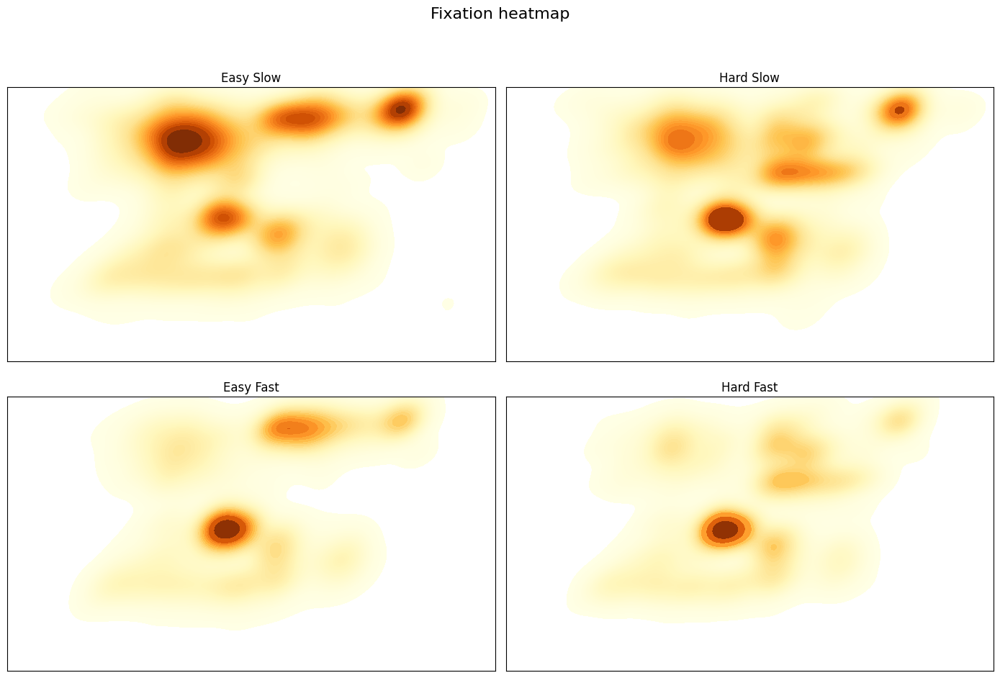

In [28]:
# Overall heatmap
aspect_ratio = 9 / 16
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Easy_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_slow['norm_pos_x'], 
    y=heatmap_df_easy_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 0],
    common_norm=True
)
axes[0, 0].set_title('Easy Slow')
axes[0, 0].set_xlim(0, 1)
axes[0, 0].set_ylim(0, 1)
axes[0, 0].set_xticks([])  # Remove x-axis ticks
axes[0, 0].set_yticks([])  # Remove y-axis ticks
axes[0, 0].set_xlabel('')  # Remove x-axis label
axes[0, 0].set_ylabel('')  # Remove y-axis label
axes[0, 0].set_aspect(aspect_ratio)

# Hard_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_slow['norm_pos_x'], 
    y=heatmap_df_hard_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 1],
    common_norm=True
)
axes[0, 1].set_title('Hard Slow')
axes[0, 1].set_xlim(0, 1)
axes[0, 1].set_ylim(0, 1)
axes[0, 1].set_xticks([])  # Remove x-axis ticks
axes[0, 1].set_yticks([])  # Remove y-axis ticks
axes[0, 1].set_xlabel('')  # Remove x-axis label
axes[0, 1].set_ylabel('')  # Remove y-axis label
axes[0, 1].set_aspect(aspect_ratio)

# Easy_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_fast['norm_pos_x'], 
    y=heatmap_df_easy_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 0],
    common_norm=True
)
axes[1, 0].set_title('Easy Fast')
axes[1, 0].set_xlim(0, 1)
axes[1, 0].set_ylim(0, 1)
axes[1, 0].set_xticks([])  # Remove x-axis ticks
axes[1, 0].set_yticks([])  # Remove y-axis ticks
axes[1, 0].set_xlabel('')  # Remove x-axis label
axes[1, 0].set_ylabel('')  # Remove y-axis label
axes[1, 0].set_aspect(aspect_ratio)

# Hard_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_fast['norm_pos_x'], 
    y=heatmap_df_hard_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 1],
    common_norm=True
)
axes[1, 1].set_title('Hard Fast')
axes[1, 1].set_xlim(0, 1)
axes[1, 1].set_ylim(0, 1)
axes[1, 1].set_xticks([])  # Remove x-axis ticks
axes[1, 1].set_yticks([])  # Remove y-axis ticks
axes[1, 1].set_xlabel('')  # Remove x-axis label
axes[1, 1].set_ylabel('')  # Remove y-axis label
axes[1, 1].set_aspect(aspect_ratio)

# Add a unique title for the entire figure
fig.suptitle(f'Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()


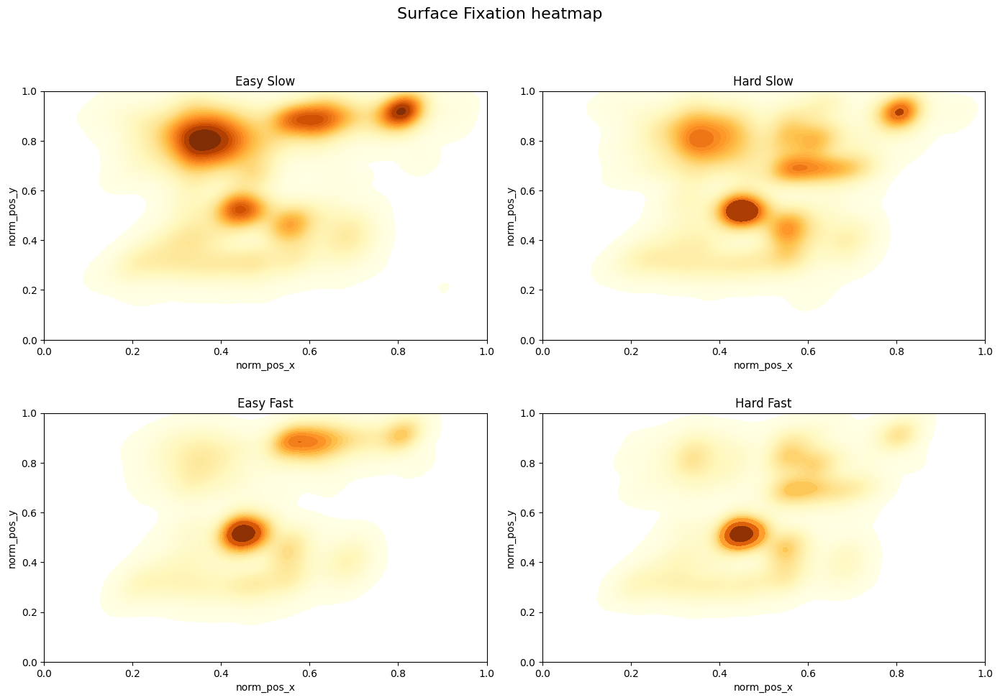

In [11]:
# Overall heatmap
aspect_ratio = 9 / 16
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Easy_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_slow['norm_pos_x'], 
    y=heatmap_df_easy_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 0],
    common_norm=True
)
axes[0, 0].set_title('Easy Slow')
axes[0, 0].set_xlim(0, 1)
axes[0, 0].set_ylim(0, 1)
axes[0, 0].set_aspect(aspect_ratio)

# Hard_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_slow['norm_pos_x'], 
    y=heatmap_df_hard_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 1],
    common_norm=True
)
axes[0, 1].set_title('Hard Slow')
axes[0, 1].set_xlim(0, 1)
axes[0, 1].set_ylim(0, 1)
axes[0, 1].set_aspect(aspect_ratio)

# Easy_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_fast['norm_pos_x'], 
    y=heatmap_df_easy_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 0],
    common_norm=True
)
axes[1, 0].set_title('Easy Fast')
axes[1, 0].set_xlim(0, 1)
axes[1, 0].set_ylim(0, 1)
axes[1, 0].set_aspect(aspect_ratio)

# Hard_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_fast['norm_pos_x'], 
    y=heatmap_df_hard_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 1],
    common_norm=True
)
axes[1, 1].set_title('Hard Fast')
axes[1, 1].set_xlim(0, 1)
axes[1, 1].set_ylim(0, 1)
axes[1, 1].set_aspect(aspect_ratio)

# Add a unique title for the entire figure
fig.suptitle(f'Surface Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()


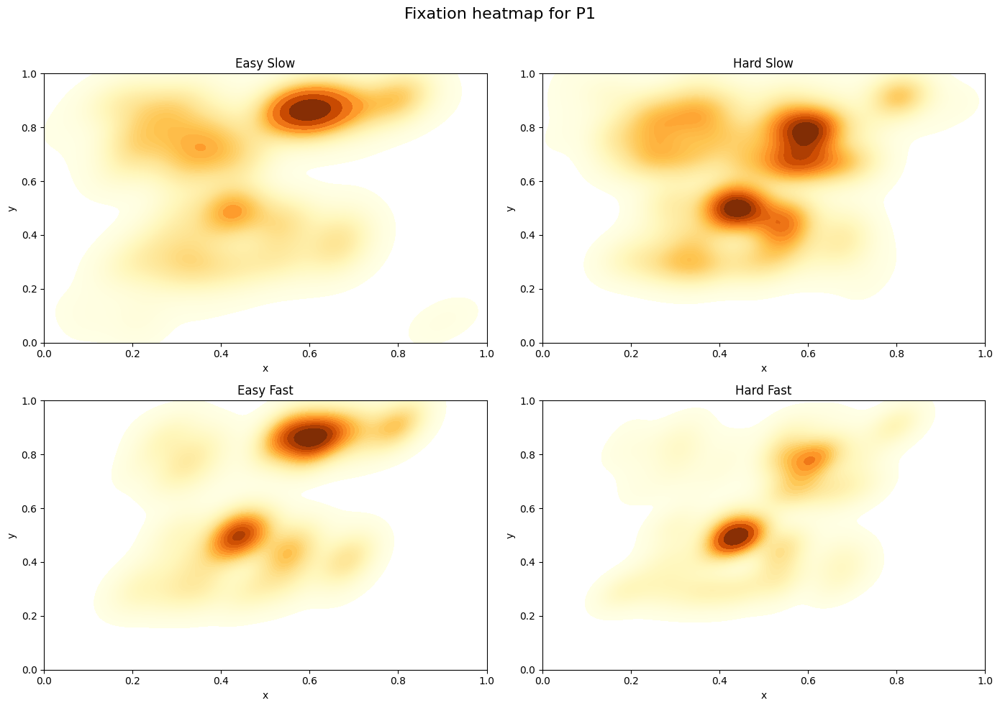

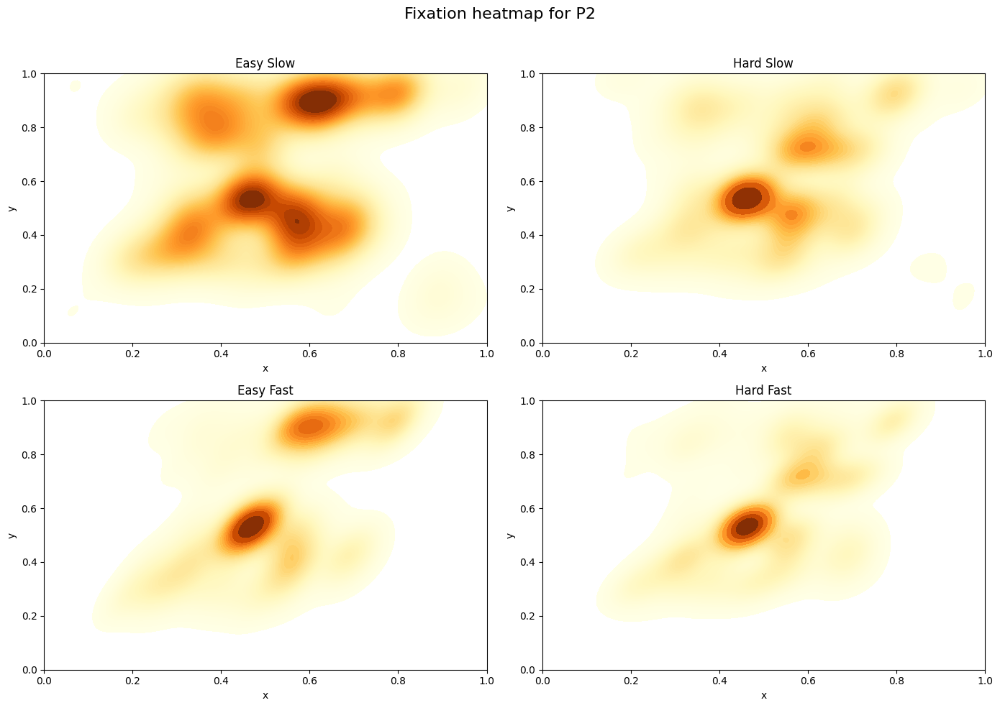

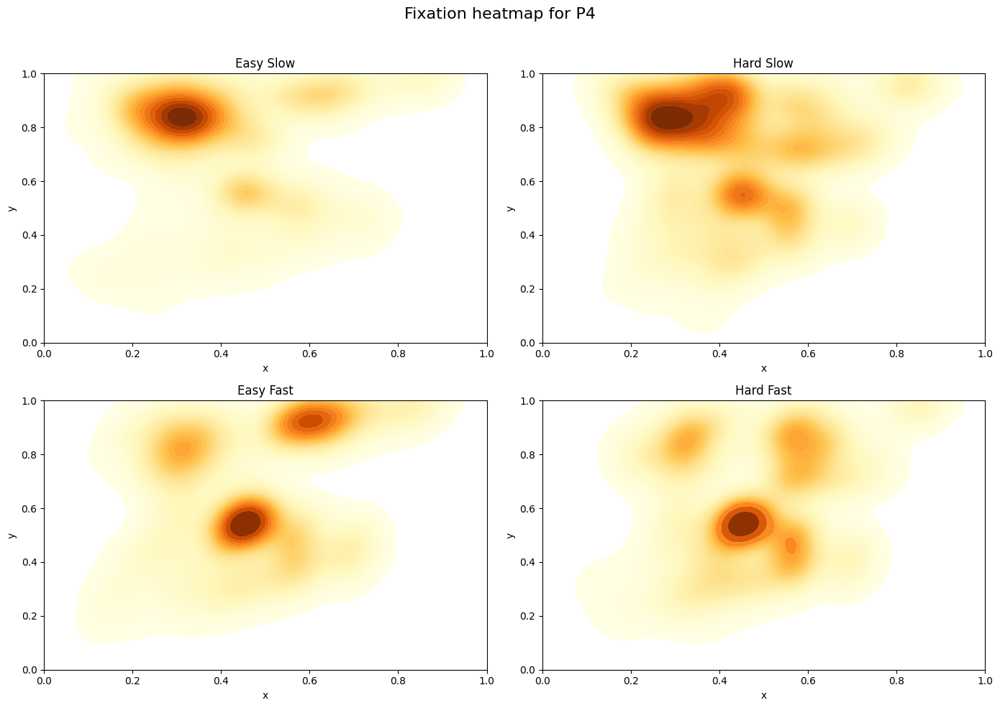

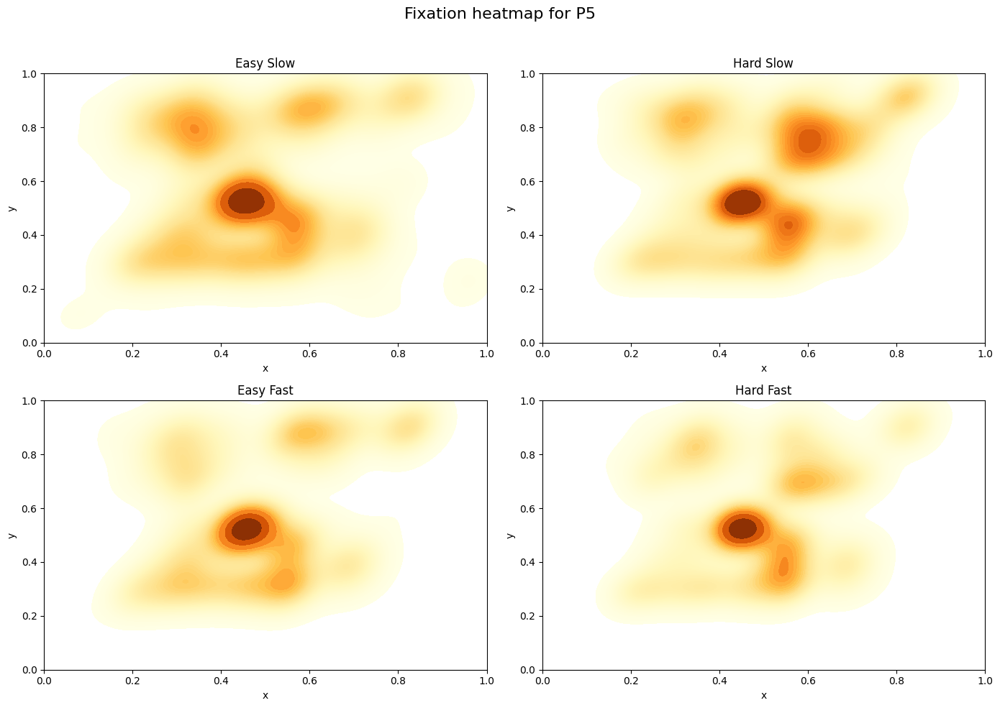

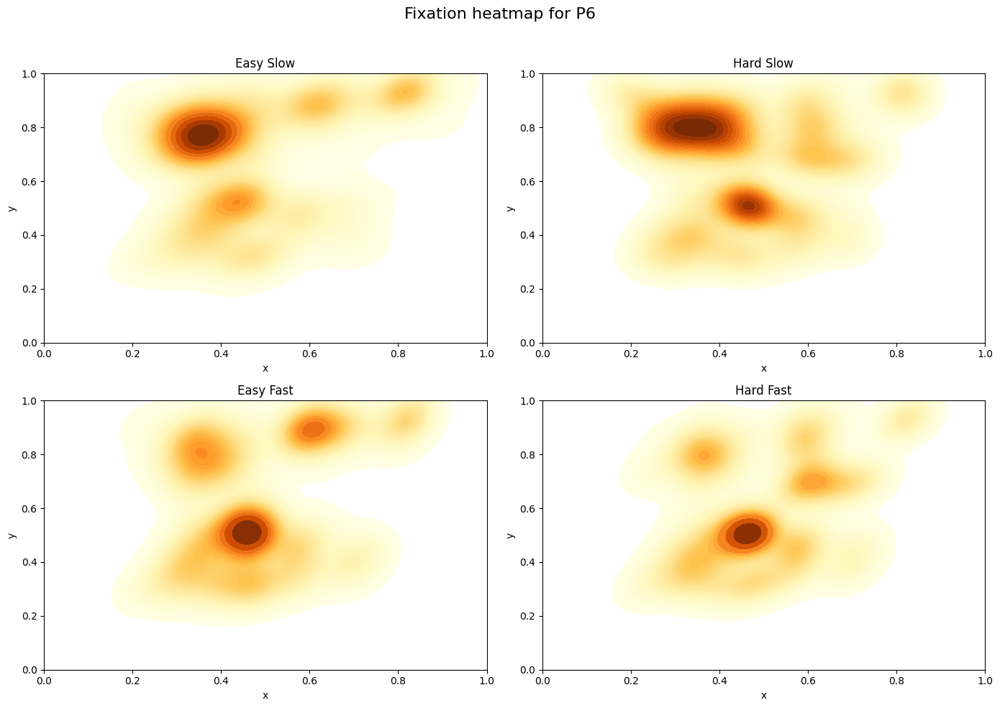

...

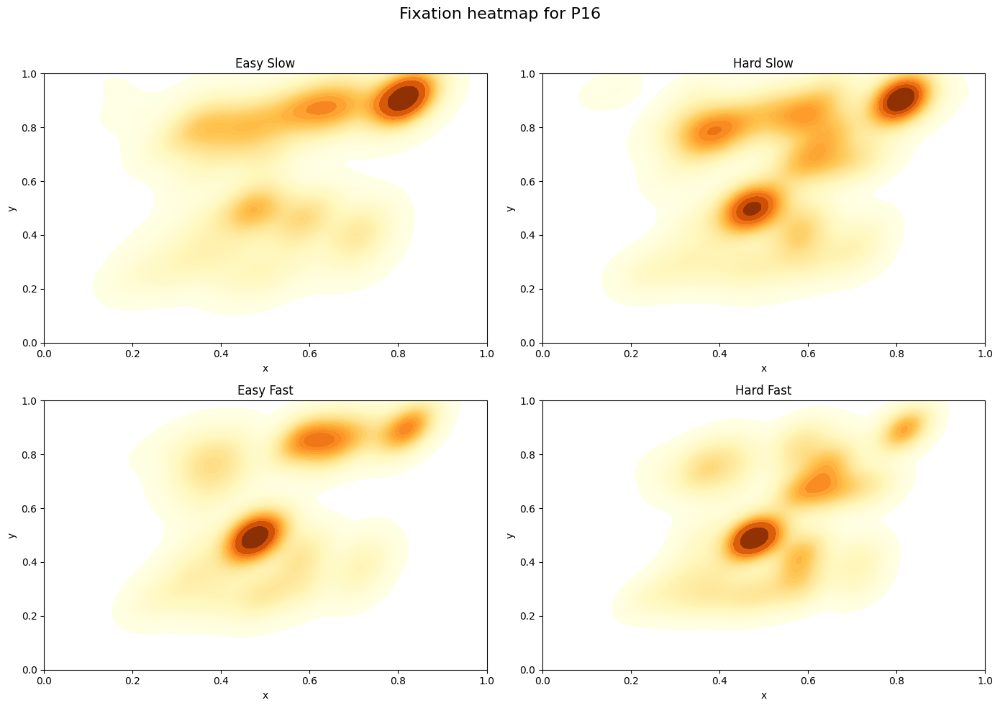

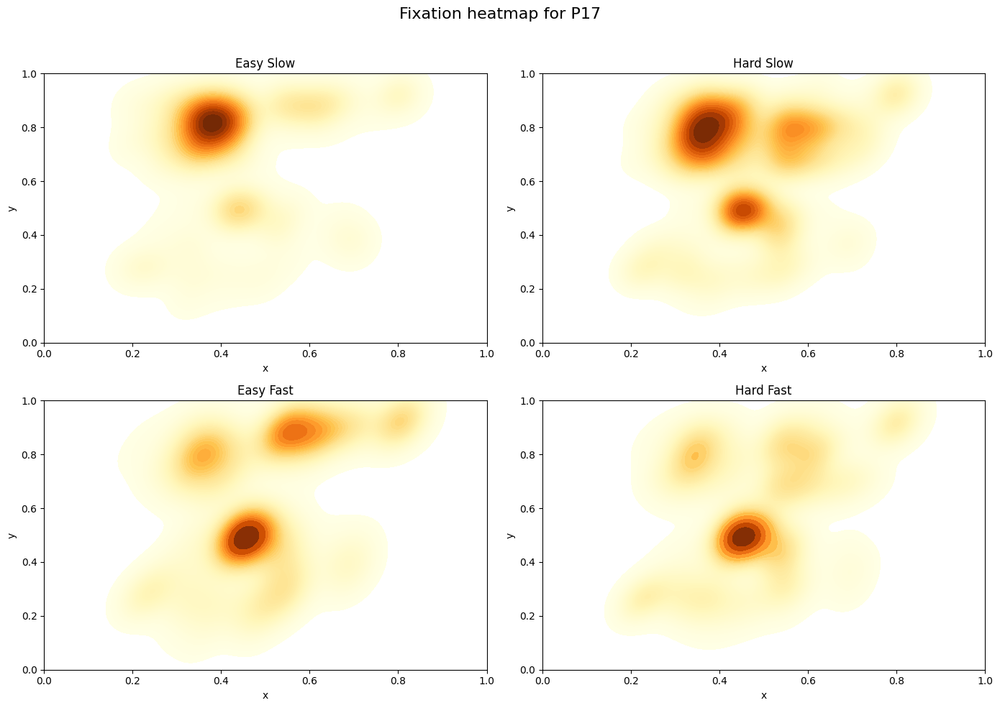

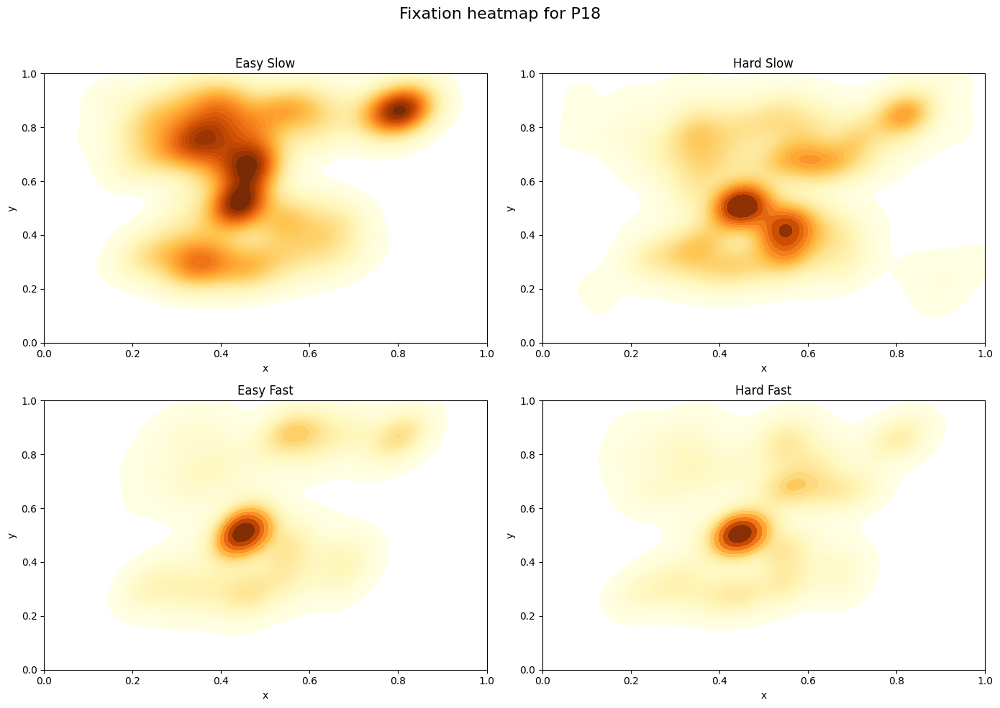

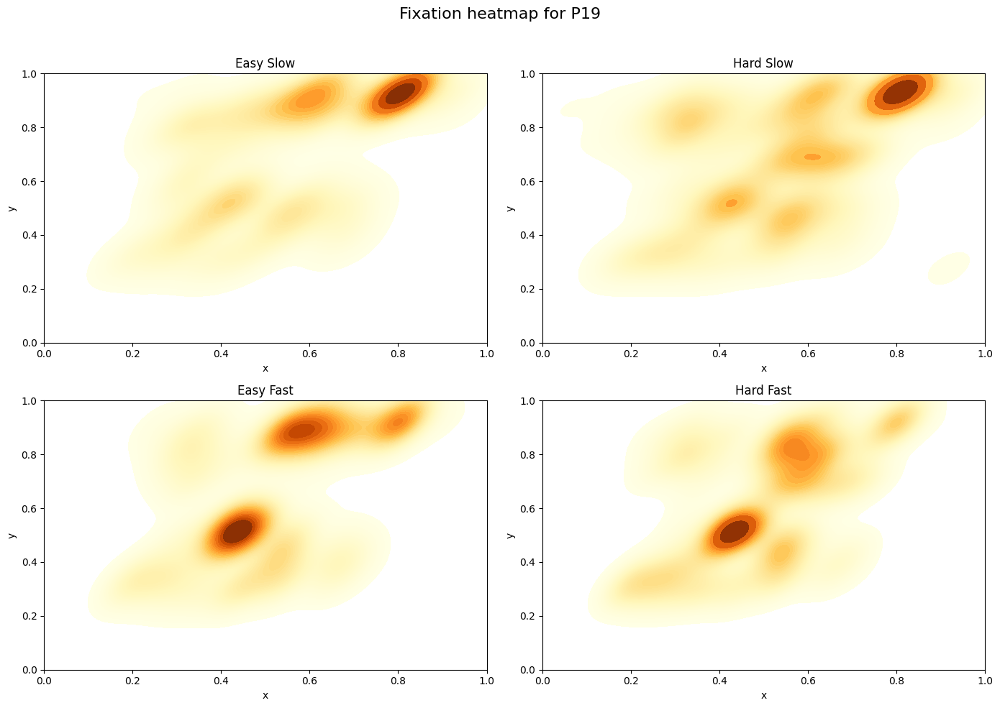

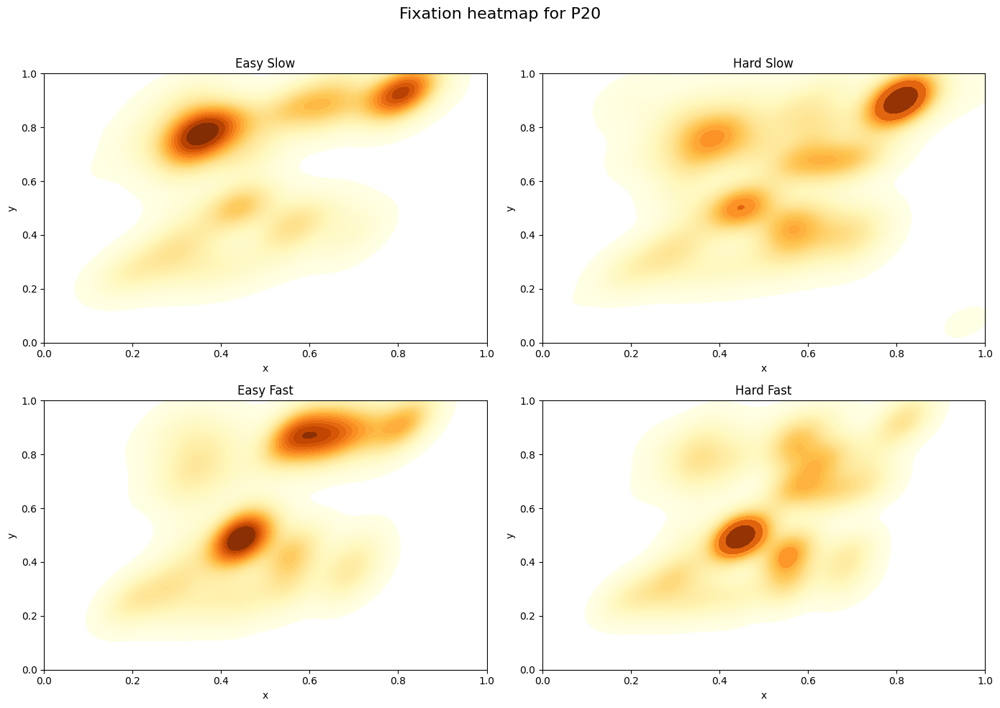

In [70]:
for pid in participant_ids:
    participant_df_easy_slow = heatmap_df_easy_slow.query(f"participant_id == {pid}")
    participant_df_hard_slow = heatmap_df_hard_slow.query(f"participant_id == {pid}")
    participant_df_easy_fast = heatmap_df_easy_fast.query(f"participant_id == {pid}")
    participant_df_hard_fast = heatmap_df_hard_fast.query(f"participant_id == {pid}")

    # Create subplots with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Easy_slow condition heatmap
    sns.kdeplot(
        x=participant_df_easy_slow['norm_pos_x'], 
        y=participant_df_easy_slow['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[0, 0],
        common_norm=True
    )
    axes[0, 0].set_title('Easy Slow')
    axes[0, 0].set_xlim(0, 1)
    axes[0, 0].set_ylim(0, 1)
    axes[0, 0].set_xlabel('x')
    axes[0, 0].set_ylabel('y')

    # Hard_slow condition heatmap
    sns.kdeplot(
        x=participant_df_hard_slow['norm_pos_x'], 
        y=participant_df_hard_slow['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[0, 1],
        common_norm=True
    )
    axes[0, 1].set_title('Hard Slow')
    axes[0, 1].set_xlim(0, 1)
    axes[0, 1].set_ylim(0, 1)
    axes[0, 1].set_xlabel('x')
    axes[0, 1].set_ylabel('y')

    # Easy_fast condition heatmap
    sns.kdeplot(
        x=participant_df_easy_fast['norm_pos_x'], 
        y=participant_df_easy_fast['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[1, 0],
        common_norm=True
    )
    axes[1, 0].set_title('Easy Fast')
    axes[1, 0].set_xlim(0, 1)
    axes[1, 0].set_ylim(0, 1)
    axes[1, 0].set_xlabel('x')
    axes[1, 0].set_ylabel('y')

    # Hard_fast condition heatmap
    sns.kdeplot(
        x=participant_df_hard_fast['norm_pos_x'], 
        y=participant_df_hard_fast['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[1, 1],
        common_norm=True
    )
    axes[1, 1].set_title('Hard Fast')
    axes[1, 1].set_xlim(0, 1)
    axes[1, 1].set_ylim(0, 1)
    axes[1, 1].set_xlabel('x')
    axes[1, 1].set_ylabel('y')

    # Add a unique title for the entire figure
    fig.suptitle(f'Fixation heatmap for P{pid}', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()

##### Fixation heatmap by Difficulty&Frequency (task-based) (overall)
- Easy_slow: areas rather than center are taken into consideration such as warning box and map (time-fillers?)
- Hard_slow: similar to easy_slow but with mre fixations also at the center (time-fillers + reading)
- Easy_fast: similar to hard_fast with a bit more or spread fixations
- Hard_fast: highly center-proned (considerable time spent at reading/checking explanations)

In [9]:
# Heatmap based on difficuty+frquency
unix_task_intervals_easy_slow = gui_df_easy_slow[['start_timestamp', 'end_timestamp']]
unix_task_intervals_hard_slow = gui_df_hard_slow[['start_timestamp', 'end_timestamp']]
unix_task_intervals_easy_fast = gui_df_easy_fast[['start_timestamp', 'end_timestamp']]
unix_task_intervals_hard_fast = gui_df_hard_fast[['start_timestamp', 'end_timestamp']]

fixation_ddf = data['surf_fixation'].query("on_surf == True"). loc[:, ['participant_id', 'start_timestamp_unix', 'norm_pos_x', 'norm_pos_y']].dropna()
fixation_df = fixation_ddf.compute()
heatmap_df = fixation_df[(fixation_df['norm_pos_x'] >= 0) & (fixation_df['norm_pos_x'] <= 1) & (fixation_df['norm_pos_y'] >= 0) & (fixation_df['norm_pos_y'] <= 1)]

# Get heatmap intervals
task_interval_mask_easy_slow = pd.Series(False, index=heatmap_df.index)
task_interval_mask_hard_slow = pd.Series(False, index=heatmap_df.index)
task_interval_mask_easy_fast = pd.Series(False, index=heatmap_df.index)
task_interval_mask_hard_fast = pd.Series(False, index=heatmap_df.index)

for start, end in unix_task_intervals_easy_slow.itertuples(index=False):
    task_interval_mask_easy_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_slow.itertuples(index=False):
    task_interval_mask_hard_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, end in unix_task_intervals_easy_fast.itertuples(index=False):
    task_interval_mask_easy_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_fast.itertuples(index=False):
    task_interval_mask_hard_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)

heatmap_df_easy_slow = heatmap_df.loc[task_interval_mask_easy_slow, :]
heatmap_df_hard_slow = heatmap_df.loc[task_interval_mask_hard_slow, :]
heatmap_df_easy_fast = heatmap_df.loc[task_interval_mask_easy_fast, :]
heatmap_df_hard_fast = heatmap_df.loc[task_interval_mask_hard_fast, :]

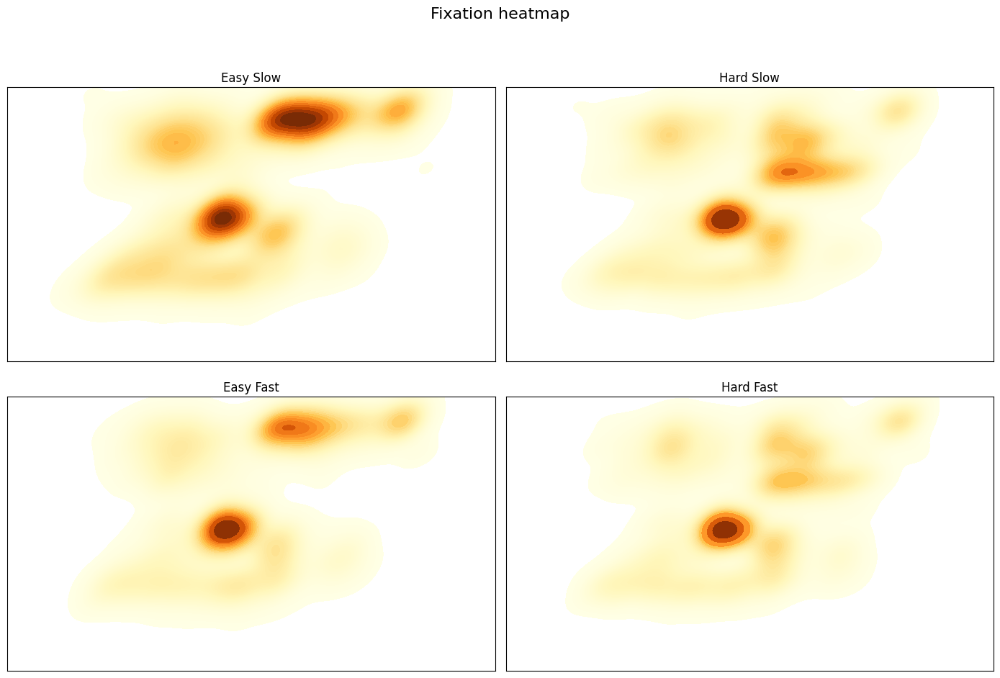

In [10]:
# Overall heatmap
aspect_ratio = 9 / 16
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Easy_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_slow['norm_pos_x'], 
    y=heatmap_df_easy_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 0],
    common_norm=True
)
axes[0, 0].set_title('Easy Slow')
axes[0, 0].set_xlim(0, 1)
axes[0, 0].set_ylim(0, 1)
axes[0, 0].set_xticks([])  # Remove x-axis ticks
axes[0, 0].set_yticks([])  # Remove y-axis ticks
axes[0, 0].set_xlabel('')  # Remove x-axis label
axes[0, 0].set_ylabel('')  # Remove y-axis label
axes[0, 0].set_aspect(aspect_ratio)

# Hard_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_slow['norm_pos_x'], 
    y=heatmap_df_hard_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 1],
    common_norm=True
)
axes[0, 1].set_title('Hard Slow')
axes[0, 1].set_xlim(0, 1)
axes[0, 1].set_ylim(0, 1)
axes[0, 1].set_xticks([])  # Remove x-axis ticks
axes[0, 1].set_yticks([])  # Remove y-axis ticks
axes[0, 1].set_xlabel('')  # Remove x-axis label
axes[0, 1].set_ylabel('')  # Remove y-axis label
axes[0, 1].set_aspect(aspect_ratio)

# Easy_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_fast['norm_pos_x'], 
    y=heatmap_df_easy_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 0],
    common_norm=True
)
axes[1, 0].set_title('Easy Fast')
axes[1, 0].set_xlim(0, 1)
axes[1, 0].set_ylim(0, 1)
axes[1, 0].set_xticks([])  # Remove x-axis ticks
axes[1, 0].set_yticks([])  # Remove y-axis ticks
axes[1, 0].set_xlabel('')  # Remove x-axis label
axes[1, 0].set_ylabel('')  # Remove y-axis label
axes[1, 0].set_aspect(aspect_ratio)

# Hard_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_fast['norm_pos_x'], 
    y=heatmap_df_hard_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 1],
    common_norm=True
)
axes[1, 1].set_title('Hard Fast')
axes[1, 1].set_xlim(0, 1)
axes[1, 1].set_ylim(0, 1)
axes[1, 1].set_xticks([])  # Remove x-axis ticks
axes[1, 1].set_yticks([])  # Remove y-axis ticks
axes[1, 1].set_xlabel('')  # Remove x-axis label
axes[1, 1].set_ylabel('')  # Remove y-axis label
axes[1, 1].set_aspect(aspect_ratio)

# Add a unique title for the entire figure
fig.suptitle(f'Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()


##### Blink rate by Difficulty
- No differences

In [81]:
# Blink rate based on difficuty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

blinks_ddf = data['blink'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

# Get heatmap intervals
interval_mask_easy = pd.Series(False, index=blinks_df.index)
interval_mask_hard = pd.Series(False, index=blinks_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)

blinks_df_easy = blinks_df.loc[interval_mask_easy, :]
blinks_df_hard = blinks_df.loc[interval_mask_hard, :]

<Figure size 1200x600 with 0 Axes>

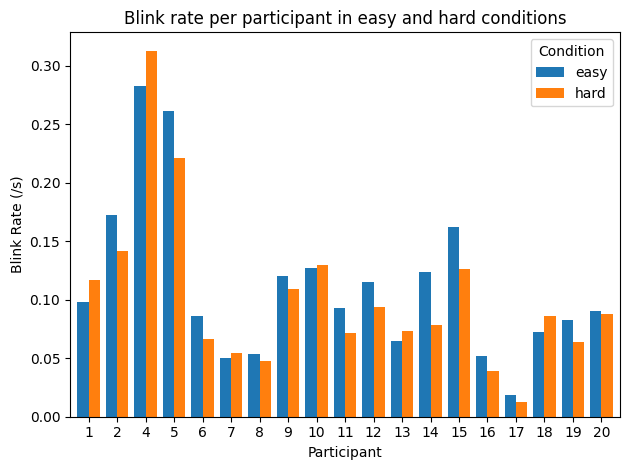

Easy: 0.1119 blink/s (~0.0684)
Hard: 0.1018 blink/s (~0.0685)


In [82]:
# Compute and Visualize
def calculate_mean_blink_rate(blinks_df, intervals):
    blink_rates = []
    for start, _, end in intervals:
        block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                 (blinks_df['start_timestamp_unix'] <= end)]
        block_duration = end - start
        blink_rate = len(block_blinks) / block_duration
        blink_rates.append(blink_rate)
    return np.mean(blink_rates)

results = {'participant_id': [], 'condition': [], 'mean_blink_rate': []}

for pid in participant_ids:
    # Filter blinks for the current participant
    p_blinks_easy = blinks_df_easy.query(f"participant_id == {pid}")
    p_blinks_hard = blinks_df_hard.query(f"participant_id == {pid}")
    p_unix_intervals_easy = gui_df_easy.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_hard = gui_df_hard.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()

    mean_blink_rate_easy = calculate_mean_blink_rate(p_blinks_easy, p_unix_intervals_easy)
    mean_blink_rate_hard = calculate_mean_blink_rate(p_blinks_hard, p_unix_intervals_hard)

    results['participant_id'].append(pid)
    results['condition'].append('easy')
    results['mean_blink_rate'].append(mean_blink_rate_easy)

    results['participant_id'].append(pid)
    results['condition'].append('hard')
    results['mean_blink_rate'].append(mean_blink_rate_hard)

results_df = pd.DataFrame(results)

# Visualize
plt.figure(figsize=(12, 6))
pivot_df = results_df.pivot(index='participant_id', columns='condition', values='mean_blink_rate')
pivot_df.plot(kind='bar', width=0.8)
plt.title('Blink rate per participant in easy and hard conditions')
plt.xlabel('Participant')
plt.ylabel('Blink Rate (/s)')
plt.xticks(rotation=0)  # Rotate x labels to 0 degrees for better readability
plt.legend(title='Condition')
plt.tight_layout()
plt.show()

# Print overall results
mean_easy = round(pivot_df['easy'].mean(), 4)
mean_hard = round(pivot_df['hard'].mean(), 4)
std_easy = round(pivot_df['easy'].std(), 4)
std_hard = round(pivot_df['hard'].std(), 4)

print(f"Easy: {mean_easy} blink/s (~{std_easy})")
print(f"Hard: {mean_hard} blink/s (~{std_hard})")

##### Blink rate by Frequency
- Overall blink rate is higher for slow condition

In [83]:
# Blink rate based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

blinks_ddf = data['blink'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

# Get heatmap intervals
interval_mask_slow = pd.Series(False, index=blinks_df.index)
interval_mask_fast = pd.Series(False, index=blinks_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)

blinks_df_slow = blinks_df.loc[interval_mask_slow, :]
blinks_df_fast = blinks_df.loc[interval_mask_fast, :]

<Figure size 1200x600 with 0 Axes>

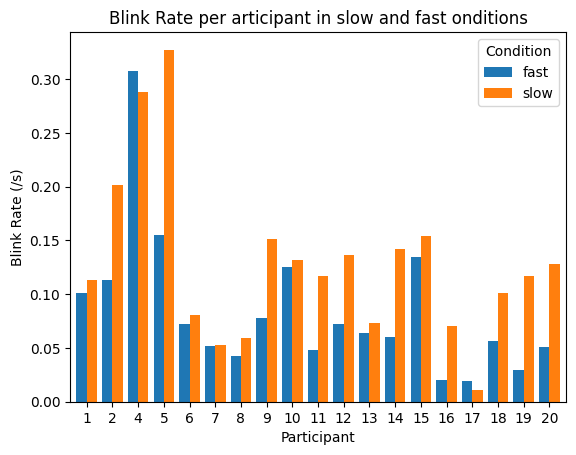

Slow: 0.1293 blink/s (~0.0767)
Fast: 0.0844 blink/s (~0.0662)


In [84]:
# Compute and Visualize
def calculate_mean_blink_rate(blinks_df, intervals):
    blink_rates = []
    for start, _, end in intervals:
        block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                 (blinks_df['start_timestamp_unix'] <= end)]
        block_duration = end - start
        blink_rate = len(block_blinks) / block_duration
        blink_rates.append(blink_rate)
    return np.mean(blink_rates)

results = {'participant_id': [], 'condition': [], 'mean_blink_rate': []}

for pid in participant_ids:
    p_blinks_slow = blinks_df_slow.query(f"participant_id == {pid}")
    p_blinks_fast = blinks_df_fast.query(f"participant_id == {pid}")
    p_unix_intervals_slow = gui_df_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_fast = gui_df_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()

    mean_blink_rate_slow = calculate_mean_blink_rate(p_blinks_slow, p_unix_intervals_slow)
    mean_blink_rate_fast = calculate_mean_blink_rate(p_blinks_fast, p_unix_intervals_fast)

    results['participant_id'].append(pid)
    results['condition'].append('slow')
    results['mean_blink_rate'].append(mean_blink_rate_slow)

    results['participant_id'].append(pid)
    results['condition'].append('fast')
    results['mean_blink_rate'].append(mean_blink_rate_fast)

results_df = pd.DataFrame(results)

# Visualize
plt.figure(figsize=(12, 6))
pivot_df = results_df.pivot(index='participant_id', columns='condition', values='mean_blink_rate')
pivot_df.plot(kind='bar', width=0.8)
plt.title('Blink Rate per articipant in slow and fast onditions')
plt.xlabel('Participant')
plt.ylabel('Blink Rate (/s)')
plt.xticks(rotation=0)  # Rotate x labels to 0 degrees for better readability
plt.legend(title='Condition')
plt.show()

# Print overall results
mean_slow = round(pivot_df['slow'].mean(), 4)
mean_fast = round(pivot_df['fast'].mean(), 4)
std_slow = round(pivot_df['slow'].std(), 4)
std_fast = round(pivot_df['fast'].std(), 4)

print(f"Slow: {mean_slow} blink/s (~{std_slow})")
print(f"Fast: {mean_fast} blink/s (~{std_fast})")

##### Blink rate by Difficulty&Frequency
- Overall slow conditions has a higher blink rate
- Easy_slow presents the highest blink rate
- Hard_fast presents the lowest blink rate

In [85]:
# Blink rate based on difficuty and frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

blinks_ddf = data['blink'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

# Get heatmap intervals
interval_mask_easy_slow = pd.Series(False, index=blinks_df.index)
interval_mask_hard_slow = pd.Series(False, index=blinks_df.index)
interval_mask_easy_fast = pd.Series(False, index=blinks_df.index)
interval_mask_hard_fast = pd.Series(False, index=blinks_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)

blinks_df_easy_slow = blinks_df.loc[interval_mask_easy_slow, :]
blinks_df_hard_slow = blinks_df.loc[interval_mask_hard_slow, :]
blinks_df_easy_fast = blinks_df.loc[interval_mask_easy_fast, :]
blinks_df_hard_fast = blinks_df.loc[interval_mask_hard_fast, :]

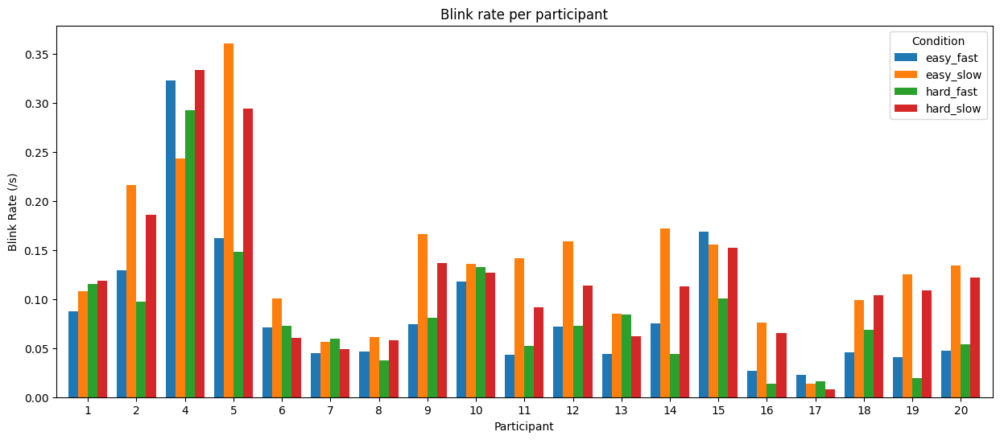

Easy_slow: 0.1373 blink/s (~0.0775)
Hard_slow: 0.1213 blink/s (~0.0796)
Easy_fast: 0.0865 blink/s (~0.0714)
Hard_fast: 0.0823 blink/s (~0.0631)


In [86]:
# Compute and Visualize
def calculate_mean_blink_rate(blinks_df, intervals):
    blink_rates = []
    for start, _, end in intervals:
        block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                 (blinks_df['start_timestamp_unix'] <= end)]
        block_duration = end - start
        blink_rate = len(block_blinks) / block_duration
        blink_rates.append(blink_rate)
    return np.mean(blink_rates)

results = {'participant_id': [], 'condition': [], 'mean_blink_rate': []}

for pid in participant_ids:
    # Filter blinks for the current participant
    p_blinks_easy_slow = blinks_df_easy_slow.query(f"participant_id == {pid}")
    p_blinks_hard_slow = blinks_df_hard_slow.query(f"participant_id == {pid}")
    p_blinks_easy_fast = blinks_df_easy_fast.query(f"participant_id == {pid}")
    p_blinks_hard_fast = blinks_df_hard_fast.query(f"participant_id == {pid}")
    p_unix_intervals_easy_slow = gui_df_easy_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_hard_slow = gui_df_hard_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_easy_fast = gui_df_easy_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_hard_fast = gui_df_hard_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()

    mean_blink_rate_easy_slow = calculate_mean_blink_rate(p_blinks_easy_slow, p_unix_intervals_easy_slow)
    mean_blink_rate_hard_slow = calculate_mean_blink_rate(p_blinks_hard_slow, p_unix_intervals_hard_slow)
    mean_blink_rate_easy_fast = calculate_mean_blink_rate(p_blinks_easy_fast, p_unix_intervals_easy_fast)
    mean_blink_rate_hard_fast = calculate_mean_blink_rate(p_blinks_hard_fast, p_unix_intervals_hard_fast)

    results['participant_id'].append(pid)
    results['condition'].append('easy_slow')
    results['mean_blink_rate'].append(mean_blink_rate_easy_slow)

    results['participant_id'].append(pid)
    results['condition'].append('hard_slow')
    results['mean_blink_rate'].append(mean_blink_rate_hard_slow)

    results['participant_id'].append(pid)
    results['condition'].append('easy_fast')
    results['mean_blink_rate'].append(mean_blink_rate_easy_fast)

    results['participant_id'].append(pid)
    results['condition'].append('hard_fast')
    results['mean_blink_rate'].append(mean_blink_rate_hard_fast)

results_df = pd.DataFrame(results)

# Visualize
pivot_df = results_df.pivot(index='participant_id', columns='condition', values='mean_blink_rate')
pivot_df.plot(kind='bar', width=0.8, figsize=(15, 6))
plt.title('Blink rate per participant')
plt.xlabel('Participant')
plt.ylabel('Blink Rate (/s)')
plt.xticks(rotation=0)  # Rotate x labels to 0 degrees for better readability
plt.legend(title='Condition')
plt.show()

# Print overall results
mean_easy_slow = round(pivot_df['easy_slow'].mean(), 4)
mean_hard_slow = round(pivot_df['hard_slow'].mean(), 4)
mean_easy_fast = round(pivot_df['easy_fast'].mean(), 4)
mean_hard_fast = round(pivot_df['hard_fast'].mean(), 4)
std_easy_slow = round(pivot_df['easy_slow'].std(), 4)
std_hard_slow = round(pivot_df['hard_slow'].std(), 4)
std_easy_fast = round(pivot_df['easy_fast'].std(), 4)
std_hard_fast = round(pivot_df['hard_fast'].std(), 4)

print(f"Easy_slow: {mean_easy_slow} blink/s (~{std_easy_slow})")
print(f"Hard_slow: {mean_hard_slow} blink/s (~{std_hard_slow})")
print(f"Easy_fast: {mean_easy_fast} blink/s (~{std_easy_fast})")
print(f"Hard_fast: {mean_hard_fast} blink/s (~{std_hard_fast})")

### 4. Questionnaire-Gui-Ocular Correlations
Workload, Flow, Reaction time, Completion time, Blink rate, Diameter

In [1]:
# Define variables
# Difficulty
easy_block = [1, 2, 5, 6]
hard_block = [3, 4, 7, 8]

# Frequency
slow_block = [1, 3, 5, 7]
fast_block = [2, 4, 6, 8]

# Difficulty+Frequency
easy_slow_block = [1, 5]
easy_fast_block = [2, 6]
hard_slow_block = [3, 7]
hard_fast_block = [4, 8]

In [8]:
# Create gui dfs
quest_df = data['quest_data'].compute()
gui_df = data['gui_data'].compute()
gui_df['block_data'] = gui_df['block_data'].apply(lambda x: eval(x))

gui_df_easy = gui_df[gui_df['block_type'].isin(easy_block)]
gui_df_hard = gui_df[gui_df['block_type'].isin(hard_block)]

gui_df_slow = gui_df[gui_df['block_type'].isin(slow_block)]
gui_df_fast = gui_df[gui_df['block_type'].isin(fast_block)]

gui_df_easy_slow = gui_df[gui_df['block_type'].isin(easy_slow_block)]
gui_df_hard_slow = gui_df[gui_df['block_type'].isin(hard_slow_block)]
gui_df_easy_fast = gui_df[gui_df['block_type'].isin(easy_fast_block)]
gui_df_hard_fast = gui_df[gui_df['block_type'].isin(hard_fast_block)]

##### Workload - Reaction time
- No correlation

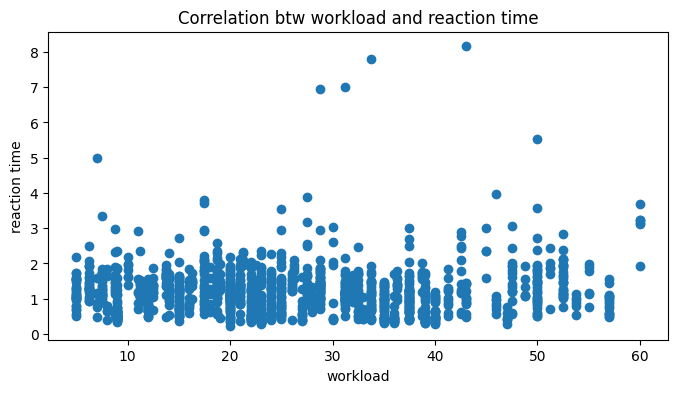

Mean: -0.06721125420597067
Std: 0.18807434232127315
    participant_id  correlation
0                1    -0.028360
1                2    -0.075164
2                4    -0.410755
3                5     0.163236
4                6    -0.245222
5                7    -0.070899
6                8     0.053531
7                9     0.305509
8               10    -0.158352
9               11    -0.082047
10              12    -0.282569
11              13    -0.197636
12              14    -0.167047
13              15     0.134557
14              16     0.160780
15              17    -0.241245
16              18    -0.264688
17              19     0.073202
18              20     0.056155


In [6]:
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    p_gui_df = gui_df.query(f"participant_id == {pid}")

    # Merge based on shared timestamps
    p_merged_df = pd.merge(
        p_quest_df,
        p_gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = p_merged_df['NASA_TLX_Score'].corr(p_merged_df['reaction_time'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})


merged_df = pd.merge(
        quest_df,
        gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
plt.figure(figsize=(8, 4))
plt.scatter(merged_df['NASA_TLX_Score'], merged_df['reaction_time'])
plt.title(f'Correlation btw workload and reaction time')
plt.xlabel('workload')
plt.ylabel('reaction time')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

##### Workload - Completion time
- No correlation

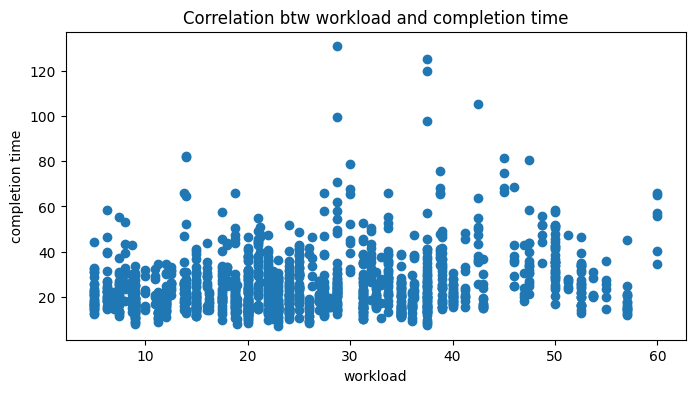

Mean: 0.11420664401716665
Std: 0.36111337549123484
    participant_id  correlation
0                1     0.334848
1                2    -0.634414
2                4     0.437317
3                5    -0.046310
4                6    -0.093329
5                7     0.161520
6                8     0.353095
7                9     0.503830
8               10    -0.276015
9               11     0.411931
10              12     0.357204
11              13     0.184135
12              14     0.624747
13              15     0.172351
14              16     0.240368
15              17    -0.566056
16              18    -0.411707
17              19     0.130837
18              20     0.285575


In [7]:
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    p_gui_df = gui_df.query(f"participant_id == {pid}")

    # Merge based on shared timestamps
    p_merged_df = pd.merge(
        p_quest_df,
        p_gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = p_merged_df['NASA_TLX_Score'].corr(p_merged_df['completion_time'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})


merged_df = pd.merge(
        quest_df,
        gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
plt.figure(figsize=(8, 4))
plt.scatter(merged_df['NASA_TLX_Score'], merged_df['completion_time'])
plt.title(f'Correlation btw workload and completion time')
plt.xlabel('workload')
plt.ylabel('completion time')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

##### Workload - Pupil diameter
- No correlation

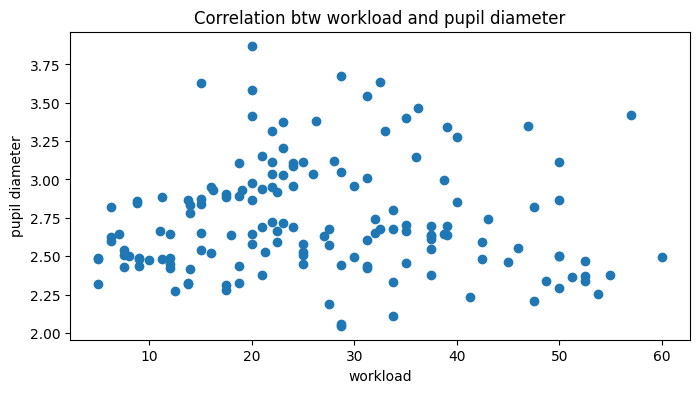

Mean: 0.12987438625000172
Std: 0.3601410915708244
    participant_id  correlation
0                1     0.071943
1                2     0.105142
2                4    -0.111671
3                5    -0.515385
4                6     0.161832
5                7    -0.219463
6                8    -0.417010
7                9    -0.420312
8               10     0.308675
9               11     0.188270
10              12     0.267118
11              13     0.610120
12              14     0.440291
13              15     0.334568
14              16     0.464773
15              17     0.563530
16              18     0.376293
17              19    -0.287122
18              20     0.546022


In [8]:
# Diameter data based on flow state
task_unix_intervals = gui_df['block_data'].apply(tuple).unique().tolist()
mean_diameters = []

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

for start, _, end in task_unix_intervals:
    task_interval_mask = (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
    task_diameter_df = diameter_df.loc[task_interval_mask, 'diameter_3d']
    mean_diameters.append(task_diameter_df.mean())

quest_df['mean_diameter'] = mean_diameters
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    correlation = p_quest_df['NASA_TLX_Score'].corr(p_quest_df['mean_diameter'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

plt.figure(figsize=(8, 4))
plt.scatter(quest_df['NASA_TLX_Score'], quest_df['mean_diameter'])
plt.title(f'Correlation btw workload and pupil diameter')
plt.xlabel('workload')
plt.ylabel('pupil diameter')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

##### Workload - Blink rate
- Potential negative correlation (?)

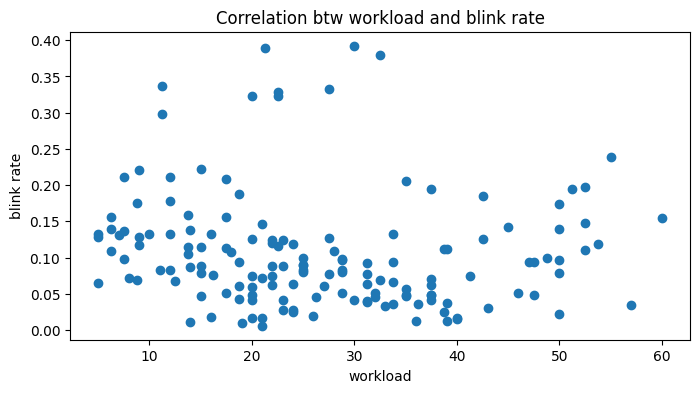

Mean: -0.143169364925937
Std: 0.5246741785980544
    participant_id  correlation
0                1     0.529890
1                2     0.670800
2                4    -0.108027
3                5    -0.878315
4                6     0.403947
5                7     0.008142
6                8    -0.205598
7                9    -0.245896
8               10    -0.075847
9               11    -0.525483
10              12    -0.552052
11              13    -0.228521
12              14    -0.740191
13              15     0.440107
14              16    -0.845607
15              17     0.464683
16              18     0.541798
17              19    -0.775713
18              20    -0.598337


In [9]:
# Blink rate based on overall workload
task_unix_intervals = gui_df['block_data'].apply(tuple).unique().tolist()
mean_blinkrates = []

blinks_ddf = data['blink'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

for start, _, end in task_unix_intervals:
    block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                (blinks_df['start_timestamp_unix'] <= end)]
    block_duration = end - start
    blink_rate = len(block_blinks) / block_duration
    mean_blinkrates.append(blink_rate)

quest_df['mean_blinkrate'] = mean_blinkrates
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    correlation = p_quest_df['NASA_TLX_Score'].corr(p_quest_df['mean_blinkrate'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

plt.figure(figsize=(8, 4))
plt.scatter(quest_df['NASA_TLX_Score'], quest_df['mean_blinkrate'])
plt.title(f'Correlation btw workload and blink rate')
plt.xlabel('workload')
plt.ylabel('blink rate')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

##### Flow state - Reaction time
- No correlation

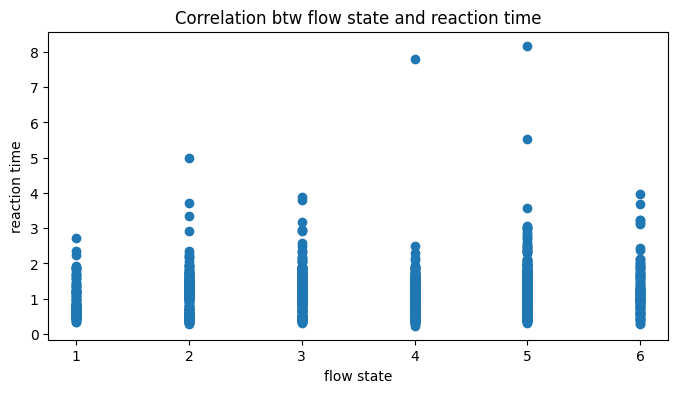

Mean: -0.10427749498799313
Std: 0.15383382859470926
    participant_id  correlation
0                1          NaN
1                2    -0.099337
2                4    -0.319726
3                5     0.017005
4                6    -0.286492
5                7    -0.074211
6                8    -0.092317
7                9     0.208639
8               10    -0.118853
9               11    -0.124882
10              12    -0.022371
11              13    -0.418931
12              14    -0.332030
13              15    -0.054754
14              16     0.075521
15              17    -0.130503
16              18    -0.056462
17              19    -0.024872
18              20    -0.022419


In [10]:
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    p_gui_df = gui_df.query(f"participant_id == {pid}")

    # Merge based on shared timestamps
    p_merged_df = pd.merge(
        p_quest_df,
        p_gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = p_merged_df['FL_Score'].corr(p_merged_df['reaction_time'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})


merged_df = pd.merge(
        quest_df,
        gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
plt.figure(figsize=(8, 4))
plt.scatter(merged_df['FL_Score'], merged_df['reaction_time'])
plt.title(f'Correlation btw flow state and reaction time')
plt.xlabel('flow state')
plt.ylabel('reaction time')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

##### Flow state - Completion time
- No correlation

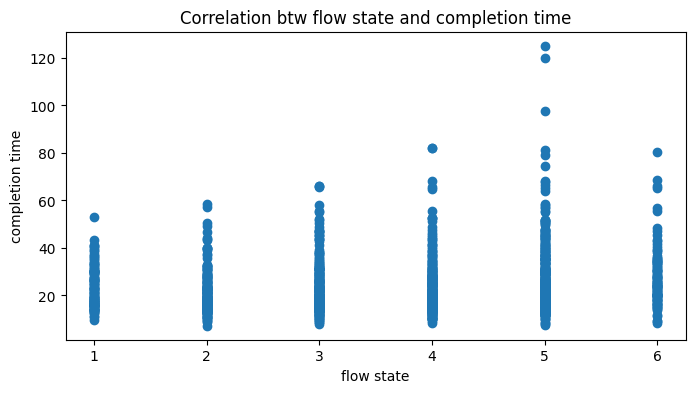

Mean: 0.030466147017504726
Std: 0.25463403290675685
    participant_id  correlation
0                1          NaN
1                2    -0.373446
2                4     0.062598
3                5     0.019703
4                6    -0.073582
5                7     0.169129
6                8     0.410870
7                9     0.213457
8               10    -0.211808
9               11     0.181189
10              12     0.222879
11              13    -0.148180
12              14     0.140928
13              15    -0.310834
14              16     0.291438
15              17    -0.473633
16              18    -0.051241
17              19     0.108278
18              20     0.370648


In [11]:
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    p_gui_df = gui_df.query(f"participant_id == {pid}")

    # Merge based on shared timestamps
    p_merged_df = pd.merge(
        p_quest_df,
        p_gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = p_merged_df['FL_Score'].corr(p_merged_df['completion_time'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})


merged_df = pd.merge(
        quest_df,
        gui_df,
        left_on=['block_id', 'block_type', 'participant_id'],
        right_on=['block_id', 'block_type', 'participant_id'],
        how='inner',
        suffixes=('_quest', '_gui')
    )
plt.figure(figsize=(8, 4))
plt.scatter(merged_df['FL_Score'], merged_df['completion_time'])
plt.title(f'Correlation btw flow state and completion time')
plt.xlabel('flow state')
plt.ylabel('completion time')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

##### Flow state - pupil diameter
- No correlation

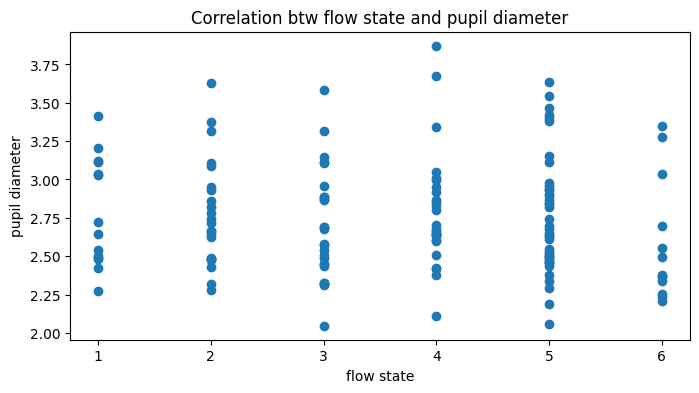

Mean: 0.00821110007720572
Std: 0.35016234941761737
    participant_id  correlation
0                1          NaN
1                2    -0.284290
2                4     0.113804
3                5    -0.662678
4                6     0.226506
5                7    -0.363948
6                8    -0.356930
7                9    -0.054800
8               10    -0.062488
9               11     0.310701
10              12     0.489219
11              13    -0.096653
12              14     0.296378
13              15    -0.398028
14              16     0.162472
15              17     0.539479
16              18     0.216313
17              19    -0.335322
18              20     0.408065


In [12]:
# Diameter data based on flow state
task_unix_intervals = gui_df['block_data'].apply(tuple).unique().tolist()
mean_diameters = []

diameter_ddf = data['pupil'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

for start, _, end in task_unix_intervals:
    task_interval_mask = (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
    task_diameter_df = diameter_df.loc[task_interval_mask, 'diameter_3d']
    mean_diameters.append(task_diameter_df.mean())

quest_df['mean_diameter'] = mean_diameters
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    correlation = p_quest_df['FL_Score'].corr(p_quest_df['mean_diameter'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

plt.figure(figsize=(8, 4))
plt.scatter(quest_df['FL_Score'], quest_df['mean_diameter'])
plt.title(f'Correlation btw flow state and pupil diameter')
plt.xlabel('flow state')
plt.ylabel('pupil diameter')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

##### Flow state - Blink rate
- Potential negative correlation (?)

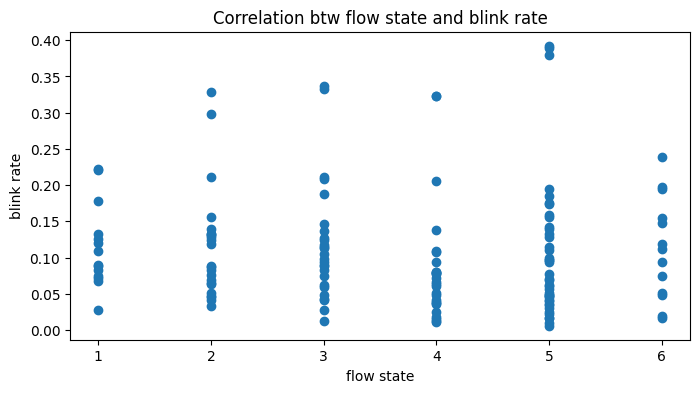

Mean: -0.11537826272331769
Std: 0.4579608660869659
    participant_id  correlation
0                1          NaN
1                2     0.760331
2                4     0.179252
3                5    -0.414736
4                6     0.342820
5                7     0.206945
6                8    -0.275065
7                9     0.517228
8               10    -0.672256
9               11    -0.292829
10              12    -0.022772
11              13     0.197621
12              14    -0.719264
13              15    -0.193851
14              16    -0.821330
15              17     0.213745
16              18    -0.069115
17              19    -0.779145
18              20    -0.234390


In [13]:
# Blink rate based on overall workload
task_unix_intervals = gui_df['block_data'].apply(tuple).unique().tolist()
mean_blinkrates = []

blinks_ddf = data['blink'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

for start, _, end in task_unix_intervals:
    block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                (blinks_df['start_timestamp_unix'] <= end)]
    block_duration = end - start
    blink_rate = len(block_blinks) / block_duration
    mean_blinkrates.append(blink_rate)

quest_df['mean_blinkrate'] = mean_blinkrates
correlation_results = []

for pid in participant_ids:
    p_quest_df = quest_df.query(f"participant_id == {pid}")
    correlation = p_quest_df['FL_Score'].corr(p_quest_df['mean_blinkrate'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

plt.figure(figsize=(8, 4))
plt.scatter(quest_df['FL_Score'], quest_df['mean_blinkrate'])
plt.title(f'Correlation btw flow state and blink rate')
plt.xlabel('flow state')
plt.ylabel('blink rate')
plt.show()

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)